In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2 as cv
from glob import glob
import nilearn as nl
import nibabel as nib
import nilearn.plotting as nlplt
from skimage.util import montage
from skimage.transform import rotate
from skimage.transform import resize
from sklearn.model_selection import train_test_split

In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("awsaf49/brats20-dataset-training-validation")


print("Path to dataset files:", path)

Resuming download from 3217031168 bytes (1251539773 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/awsaf49/brats20-dataset-training-validation?dataset_version_number=1 (3217031168/4468570941) bytes left.


100%|██████████| 4.16G/4.16G [07:21<00:00, 2.83MB/s]

Extracting files...


Path to dataset files: /Users/matin/.cache/kagglehub/datasets/awsaf49/brats20-dataset-training-validation/versions/1


In [6]:
segment_classes = ['not tumor','necrotic' , 'edema' , 'enhancing']
num_classes = len(segment_classes)

In [7]:
train_path = '/Users/matin/.cache/kagglehub/datasets/awsaf49/brats20-dataset-training-validation/versions/1/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/'
validation_path = '/Users/matin/.cache/kagglehub/datasets/awsaf49/brats20-dataset-training-validation/versions/1/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData/'

In [8]:
dataset_directories = [i.path for i in os.scandir(train_path) if i.is_dir()]
train_dataset_directories , validation_dataset_directories = train_test_split(dataset_directories , test_size=0.1 , random_state=6)
train_dataset_directories , test_dataset_directories = train_test_split(train_dataset_directories , test_size=0.1 , random_state=6)
#dataset_directories.remove(train_path + 'BraTS20_Training_335')
print('the number of train_dataset is {} , validation_dataset is : {} , test_dataset is : {}'.format(len(train_dataset_directories) , len(validation_dataset_directories) , len(test_dataset_directories)))

the number of train_dataset is 298 , validation_dataset is : 37 , test_dataset is : 34


In [9]:
import tensorflow as tf
import numpy as np
import nibabel as nib
from glob import glob
import os

def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def data_generator(folder_paths):
    for folder in folder_paths:
        folder = folder.decode('utf-8')
        files = glob(os.path.join(folder, '*.nii'))

        for fl in files:
            if 't1' in fl and 't1ce' not in fl:
                t1 = normalize(nib.load(fl).get_fdata())
            elif 'flair' in fl:
                flair = normalize(nib.load(fl).get_fdata())
            elif 't2' in fl:
                t2 = normalize(nib.load(fl).get_fdata())
            elif 't1ce' in fl:
                t1ce = normalize(nib.load(fl).get_fdata())
            elif 'seg' in fl.lower():
                segment = nib.load(fl).get_fdata()

        input_data = np.stack([flair, t1, t1ce, t2], axis=0).astype(np.float32)

        if 4 in np.unique(segment):
            segment[segment == 4] = 3
        segment = tf.cast(segment, dtype=tf.int32)
        segment = tf.one_hot(segment, depth=num_classes, axis=-1)

        input_data = tf.transpose(input_data, perm=[1, 2, 3, 0])
        yield np.array(input_data), np.array(segment).astype(np.float32)

In [10]:
train_dataset = tf.data.Dataset.from_generator(data_generator , args=[train_dataset_directories] , output_types=(tf.float32 , tf.float32) , output_shapes=((240,240,155,4) , (240,240,155,4)) )
validation_dataset = tf.data.Dataset.from_generator(data_generator , args=[validation_dataset_directories] , output_types=(tf.float32 , tf.float32) , output_shapes=((240,240,155,4) , (240,240,155,4)) )

Instructions for updating:
Use output_signature instead
Instructions for updating:
Use output_signature instead


In [11]:
train_dataset = train_dataset.batch(2).prefetch(tf.data.AUTOTUNE)
validation_dataset = validation_dataset.batch(2).prefetch(tf.data.AUTOTUNE)

In [12]:
for i , j in train_dataset:
  print(i.shape , j.shape)
  break

(2, 240, 240, 155, 4) (2, 240, 240, 155, 4)


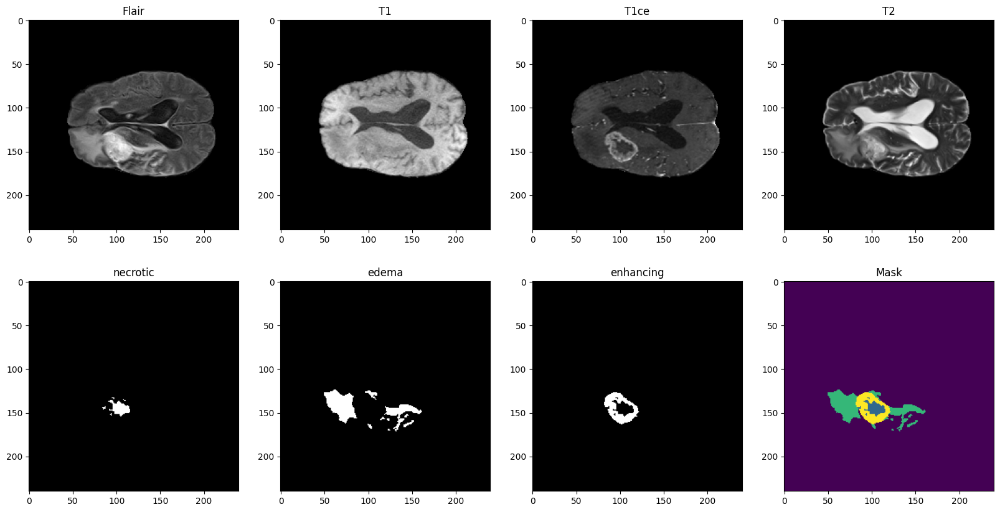

In [20]:
plt.figure(figsize=(20,10))
n = 1
plt.subplot(2,4,1);plt.imshow(i[n][...,0][...,i.shape[3]//2],cmap='gray');plt.title('Flair');
plt.subplot(2,4,2);plt.imshow(i[n][...,1][...,i.shape[3]//2],cmap='gray');plt.title('T1');
plt.subplot(2,4,3);plt.imshow(i[n][...,2][...,i.shape[3]//2],cmap='gray');plt.title('T1ce');
plt.subplot(2,4,4);plt.imshow(i[n][...,3][...,i.shape[3]//2],cmap='gray');plt.title('T2');
plt.subplot(2,4,5);plt.imshow(j[n][...,1][...,j.shape[3]//2],cmap='gray');plt.title(segment_classes[1]);
plt.subplot(2,4,6);plt.imshow(j[n][...,2][...,j.shape[3]//2],cmap='gray');plt.title(segment_classes[2]);
plt.subplot(2,4,7);plt.imshow(j[n][...,3][...,j.shape[3]//2],cmap='gray');plt.title(segment_classes[3]);
plt.subplot(2,4,8);plt.imshow(np.argmax(j[n],axis=-1)[...,j.shape[3]//2]);plt.title('Mask');

In [21]:
sample_image_flair = nib.load(train_path + 'BraTS20_Training_001/BraTS20_Training_001_flair.nii').get_fdata()
sample_image_seg = nib.load(train_path + 'BraTS20_Training_001/BraTS20_Training_001_seg.nii').get_fdata()
sample_image_T1 = nib.load(train_path + 'BraTS20_Training_001/BraTS20_Training_001_t1.nii').get_fdata()
sample_image_T1ce = nib.load(train_path + 'BraTS20_Training_001/BraTS20_Training_001_t1ce.nii').get_fdata()
sample_image_T2 = nib.load(train_path + 'BraTS20_Training_001/BraTS20_Training_001_t2.nii').get_fdata()

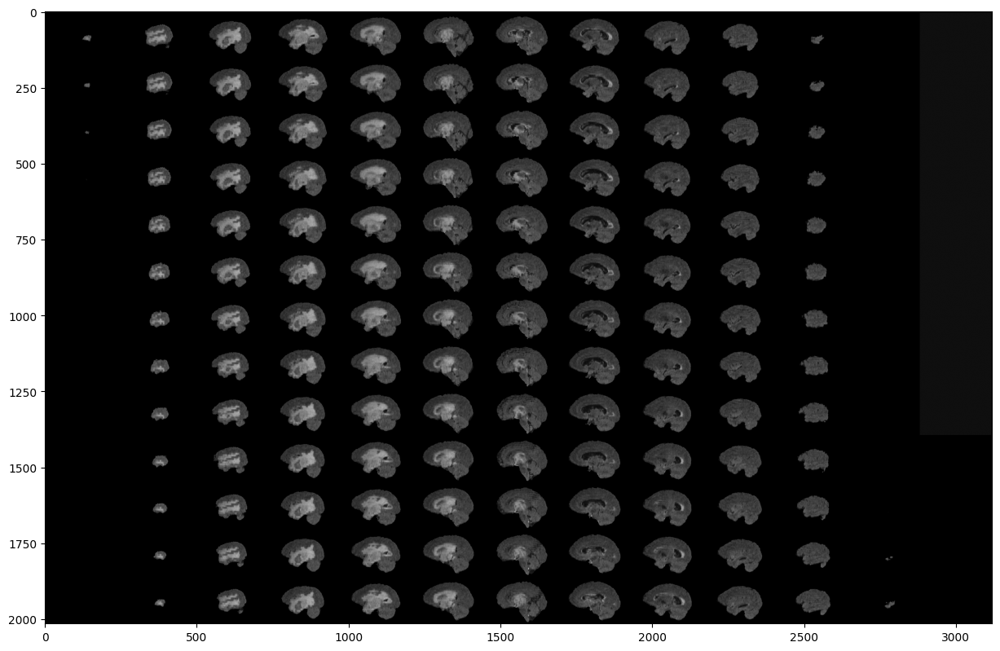

In [22]:
plt.figure(figsize=(15,15))
plt.imshow(rotate(montage(sample_image_flair[40:-40,:,:]) , 90 , resize=True) , cmap='gray')

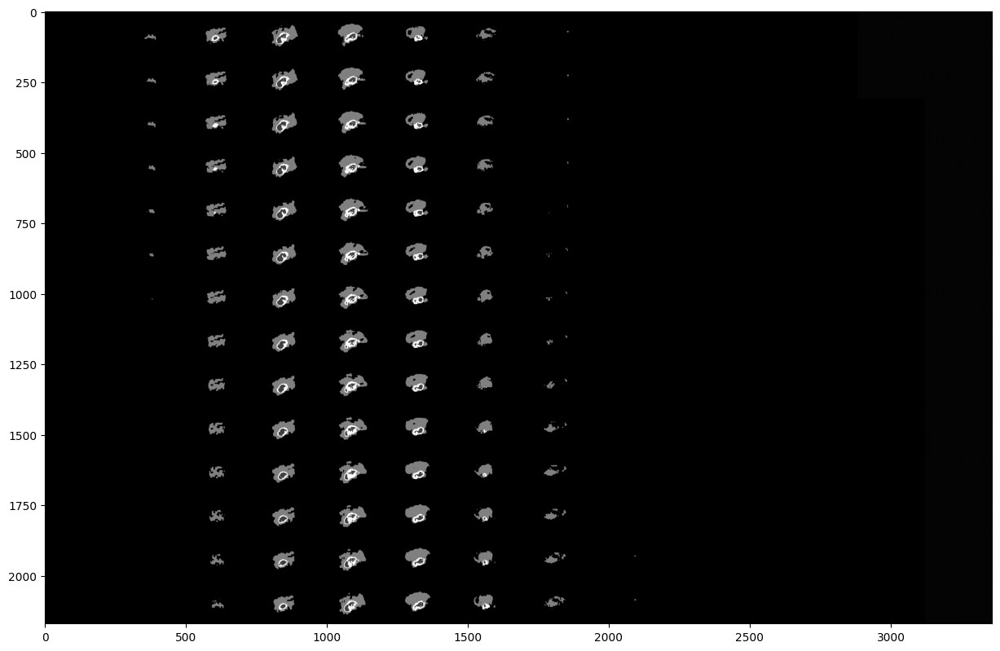

In [23]:
plt.figure(figsize=(15,15))
plt.imshow(rotate(montage(sample_image_seg[30:-30,:,:]) , 90 , resize=True) , cmap='gray')

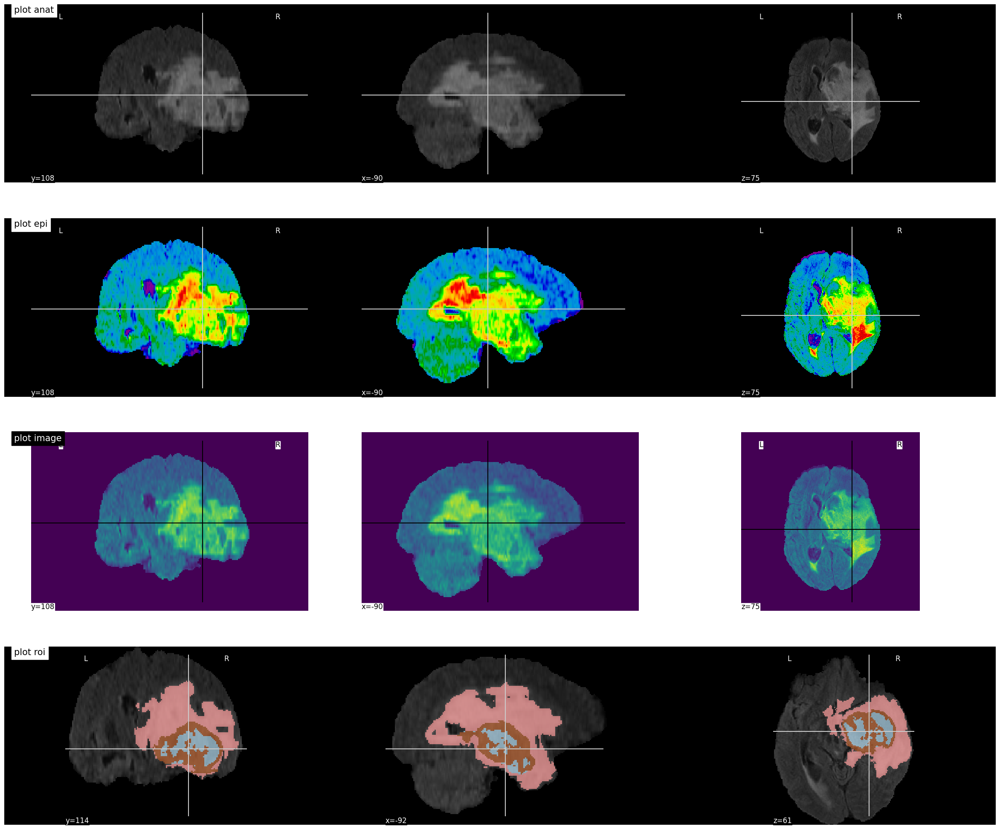

In [24]:
niimg = nl.image.load_img(train_path + 'BraTS20_Training_001/BraTS20_Training_001_flair.nii')
nimask = nl.image.load_img(train_path + 'BraTS20_Training_001/BraTS20_Training_001_seg.nii')

fig , axes = plt.subplots(nrows=4 , figsize=(30,25))

nlplt.plot_anat(niimg , axes=axes[0] , title='plot anat')
nlplt.plot_epi(niimg , axes=axes[1] , title='plot epi')
nlplt.plot_img(niimg , axes=axes[2] , title='plot image')
nlplt.plot_roi(nimask , axes=axes[3] , bg_img=niimg , title='plot roi' , cmap='Paired')

# **METRICS**

In [25]:
def dice_coef(y_true , y_pred , smooth=1.0):
  total_loss = 0
  for i in range(num_classes):
    y_true_1D = tf.reshape(y_true[...,i] , [-1])
    y_pred_1D = tf.reshape(y_pred[...,i] , [-1])
    intersection = tf.reduce_sum(y_true_1D * y_pred_1D)

    loss = (2 * intersection + smooth) / (tf.reduce_sum(y_true_1D) + tf.reduce_sum(y_pred_1D) + smooth)
    total_loss += loss

  total_loss /= num_classes
  return total_loss

def dice_coef_neotric(y_true,y_pred,epsilon=1e-6):
  intersection = tf.reduce_sum(tf.abs(y_true[...,1] * y_pred[...,1]))
  return (2 * intersection) / (tf.reduce_sum(tf.square(y_true[...,1])) + tf.reduce_sum(tf.square(y_pred[...,1])) + epsilon)

def dice_coef_edema(y_true,y_pred,epsilon=1e-6):
  intersection = tf.reduce_sum(tf.abs(y_true[...,2] * y_pred[...,2]))
  return (2 * intersection) / (tf.reduce_sum(tf.square(y_true[...,2])) + tf.reduce_sum(tf.square(y_pred[...,2])) + epsilon)

def dice_coef_enhancing(y_true,y_pred,epsilon=1e-6):
  intersection = tf.reduce_sum(tf.abs(y_true[...,3] * y_pred[...,3]))
  return (2 * intersection) / (tf.reduce_sum(tf.square(y_true[...,3])) + tf.reduce_sum(tf.square(y_pred[...,3])) + epsilon)

def precision(y_true,y_pred):
  true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred , 0 , 1)))
  predicted_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_pred , 0 , 1)))
  return true_positives / (predicted_positives + tf.keras.backend.epsilon())

def sensitivity(y_true,y_pred):
  true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred , 0 , 1)))
  possible_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true , 0 , 1)))
  return true_positives / (possible_positives + tf.keras.backend.epsilon())

def specificity(y_true,y_pred):
  true_negatives = tf.reduce_sum(tf.round(tf.clip_by_value((1-y_true) * (1-y_pred) , 0 , 1)))
  possible_negatives = tf.reduce_sum(tf.round(tf.clip_by_value(1-y_true,0 , 1)))
  return true_negatives / (possible_negatives + tf.keras.backend.epsilon())

In [26]:
def UNET3D(input_shape , out_channels , n_classes):
  def encoder_block(inputs , num_filters):
    x = tf.keras.layers.Conv3D(num_filters , 3 , padding='same' , kernel_initializer='he_normal')(inputs)
    x = tf.keras.layers.ReLU()(x)
    x = tf.keras.layers.Conv3D(num_filters , 3 , padding='same', kernel_initializer='he_normal')(x)
    x = tf.keras.layers.ReLU()(x)
    return x

  def decoder_block(inputs , num_filters , skip_features):
    x = tf.keras.layers.Conv3DTranspose(num_filters , (2,2,2) , strides=(2,2,2) , padding='same', kernel_initializer='he_normal')(inputs)
    if x.shape[3] > skip_features.shape[3]:
      x = x[: , : , : , :skip_features.shape[3]]
    elif x.shape[3] < skip_features.shape[3]:
      skip_features = skip_features[: , : , : , :x.shape[3]]
    x = tf.keras.layers.Concatenate(axis=-1)([x , skip_features])
    return x

  inputs = tf.keras.layers.Input(shape=input_shape)

  skip_1 = encoder_block(inputs , out_channels)
  pool_1 = tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='same')(skip_1)
  skip_2 = encoder_block(pool_1 , out_channels*2)
  pool_2 = tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='same')(skip_2)

  skip_3 = encoder_block(pool_2 , out_channels*4)
  pool_3 = tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='same')(skip_3)

  skip_4 = encoder_block(pool_3 , out_channels*8)
  pool_4 = tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding='same')(skip_4)

  bridge = encoder_block(pool_4 , out_channels*16)
  decoder_1 = decoder_block(bridge , out_channels*8 , skip_4)
  decoder_2 = decoder_block(decoder_1 , out_channels*4 , skip_3)
  decoder_3 = decoder_block(decoder_2 , out_channels*2 , skip_2)
  decoder_4 = decoder_block(decoder_3 , out_channels , skip_1)

  outputs = tf.keras.layers.Conv3D(n_classes , (1,1,1) , activation='softmax')(decoder_4)
  model = tf.keras.Model(inputs , outputs)
  return model

In [27]:
def combined_loss(y_true, y_pred, lambda_dice=0.8, epsilon=1e-6):
  cce_loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
  intersection = tf.reduce_sum(y_true * y_pred, axis=(1, 2, 3))
  union = tf.reduce_sum(y_true, axis=(1, 2, 3)) + tf.reduce_sum(y_pred, axis=(1, 2, 3))
  dice = (2. * intersection + epsilon) / (union + epsilon)
  dice_loss = 1 - tf.reduce_mean(dice)
  total_loss = lambda_dice * dice_loss + (1 - lambda_dice) * cce_loss
  return tf.reduce_mean(total_loss)


In [28]:
metrics = [tf.keras.metrics.CategoricalAccuracy(), tf.keras.metrics.MeanIoU(num_classes=num_classes) , precision , sensitivity , specificity , dice_coef , dice_coef_neotric , dice_coef_edema , dice_coef_enhancing]
model = UNET3D(input_shape=(240, 240, 155,4), out_channels=64, n_classes=num_classes)
model.compile(optimizer=tf.keras.optimizers.Adam(),  loss=combined_loss, metrics=metrics)

In [29]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 240, 240, 155,  │              0 │ -                      │
│                           │ 4)                     │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d (Conv3D)           │ (None, 240, 240, 155,  │          6,976 │ input_layer[0][0]      │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 240, 240, 155,  │              0 │ conv3d[0][0]           │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_1 (Conv3D)         │ (None, 240, 240, 155,  │        110,656 │ re_lu[0][0]            │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 240, 240, 155,  │              0 │ conv3d_1[0][0]         │
│                           │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling3d             │ (None, 120, 120, 78,   │              0 │ re_lu_1[0][0]          │
│ (MaxPooling3D)            │ 64)                    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_2 (Conv3D)         │ (None, 120, 120, 78,   │        221,312 │ max_pooling3d[0][0]    │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 120, 120, 78,   │              0 │ conv3d_2[0][0]         │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_3 (Conv3D)         │ (None, 120, 120, 78,   │        442,496 │ re_lu_2[0][0]          │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 120, 120, 78,   │              0 │ conv3d_3[0][0]         │
│                           │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling3d_1           │ (None, 60, 60, 39,     │              0 │ re_lu_3[0][0]          │
│ (MaxPooling3D)            │ 128)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv3d_4 (Conv3D)         │ (None, 60, 60, 39,     │        884,992 │ max_pooling3d_1[0][0]  │
│                           │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_4 (ReLU)            │ (None, 60, 60, 39,     │              0 │ conv3d_4[0][0]         │
│                           │ 256)                   │                │                        │
├──────────────────────

 Total params: 63,471,684 (242.13 MB)

 Trainable params: 63,471,684 (242.13 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
check_callback = tf.keras.callbacks.ModelCheckpoint('best_model_final.keras' , monitor='val_loss' , mode='min' , save_best_only=True , save_weights_only=False , verbose=1)
def scheduler_lr(epoch):
  if epoch < 10:
    return 1e-3
  if epoch < 20:
    return 1e-4
  else:
    return 5e-5
scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler_lr)

In [ ]:
model.fit(train_dataset , validation_data=validation_dataset , epochs=40 , shuffle=True , callbacks=[check_callback , scheduler_callback])

Epoch 1/40
    149/Unknown 598s 4s/step - categorical_accuracy: 0.9419 - dice_coef: 0.2612 - dice_coef_edema: 0.1216 - dice_coef_enhancing: 0.0686 - dice_coef_neotric: 0.0851 - loss: 0.6608 - mean_io_u: 0.4751 - precision: 0.9358 - sensitivity: 0.8574 - specificity: 0.9941

/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)



Epoch 1: val_loss improved from inf to 0.51887, saving model to best_model_final.keras
149/149 ━━━━━━━━━━━━━━━━━━━━ 705s 4s/step - categorical_accuracy: 0.9421 - dice_coef: 0.2616 - dice_coef_edema: 0.1222 - dice_coef_enhancing: 0.0689 - dice_coef_neotric: 0.0857 - loss: 0.6603 - mean_io_u: 0.4751 - precision: 0.9361 - sensitivity: 0.8580 - specificity: 0.9941 - val_categorical_accuracy: 0.9859 - val_dice_coef: 0.3907 - val_dice_coef_edema: 0.3509 - val_dice_coef_enhancing: 0.1091 - val_dice_coef_neotric: 0.2604 - val_loss: 0.5189 - val_mean_io_u: 0.4972 - val_precision: 0.9880 - val_sensitivity: 0.9850 - val_specificity: 0.9960 - learning_rate: 0.0010
Epoch 2/40
149/149 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - categorical_accuracy: 0.9829 - dice_coef: 0.4015 - dice_coef_edema: 0.3318 - dice_coef_enhancing: 0.1854 - dice_coef_neotric: 0.2803 - loss: 0.5069 - mean_io_u: 0.4873 - precision: 0.9864 - sensitivity: 0.9817 - specificity: 0.9955
Epoch 2: val_loss improved from 0.51887 to 0.48305, s

In [13]:
best_model = tf.keras.models.load_model('best_model_final.keras' , compile=False)

In [14]:
test_dataset = tf.data.Dataset.from_generator(data_generator , args=[test_dataset_directories] , output_types=(tf.float32 , tf.float32) , output_shapes=((240,240,155,4) , (240,240,155,4))).batch(1).prefetch(tf.data.AUTOTUNE)

In [15]:
test_inputs = [i for i,j in test_dataset]

In [16]:
test_masks = [j for i,j in test_dataset]

In [29]:
def show_predicted(input_data,real_mask):
    predicted_mask = best_model.predict(input_data , verbose=0)
    plt.figure(figsize=(20,17))
    plt.subplot(3,4,1);plt.imshow(input_data[0][...,0][...,input_data.shape[3]//2],cmap='gray');plt.title('Flair');
    plt.subplot(3,4,2);plt.imshow(input_data[0][...,1][...,input_data.shape[3]//2],cmap='gray');plt.title('T1');
    plt.subplot(3,4,3);plt.imshow(input_data[0][...,2][...,input_data.shape[3]//2],cmap='gray');plt.title('T1ce');
    plt.subplot(3,4,4);plt.imshow(input_data[0][...,3][...,input_data.shape[3]//2],cmap='gray');plt.title('T2');
    plt.subplot(3,4,5);plt.imshow(real_mask[0][...,1][...,real_mask.shape[3]//2],cmap='gray');plt.title(segment_classes[1]);
    plt.subplot(3,4,6);plt.imshow(real_mask[0][...,2][...,real_mask.shape[3]//2],cmap='gray');plt.title(segment_classes[2]);
    plt.subplot(3,4,7);plt.imshow(real_mask[0][...,3][...,real_mask.shape[3]//2],cmap='gray');plt.title(segment_classes[3]);
    plt.subplot(3,4,8);plt.imshow(np.argmax(real_mask[0],axis=-1)[...,real_mask.shape[3]//2]);plt.title('Real Mask');
    plt.subplot(3,4,9);plt.imshow(predicted_mask[0][...,1][...,predicted_mask.shape[3]//2],cmap='gray');plt.title(segment_classes[1]);
    plt.subplot(3,4,10);plt.imshow(predicted_mask[0][...,2][...,predicted_mask.shape[3]//2],cmap='gray');plt.title(segment_classes[2]);
    plt.subplot(3,4,11);plt.imshow(predicted_mask[0][...,3][...,predicted_mask.shape[3]//2],cmap='gray');plt.title(segment_classes[3]);
    plt.subplot(3,4,12);plt.imshow(np.argmax(predicted_mask[0],axis=-1)[...,predicted_mask.shape[3]//2]);plt.title('Predicted Mask');

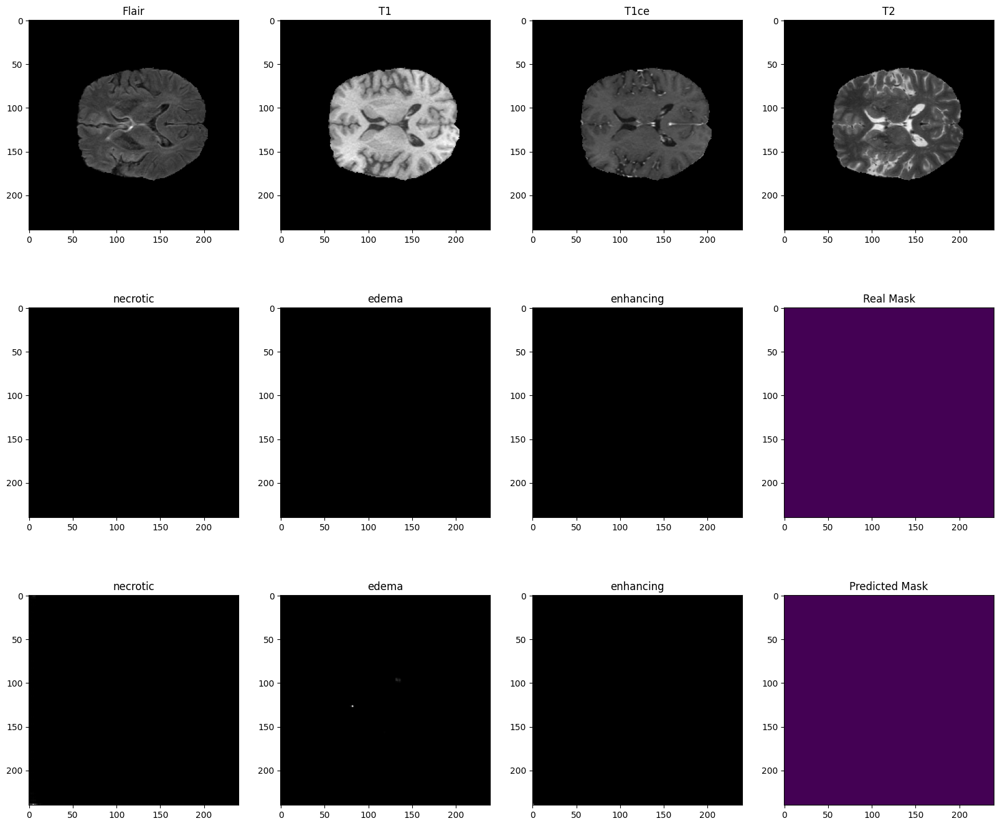

In [30]:
n = 0
show_predicted(test_inputs[n] , test_masks[n])

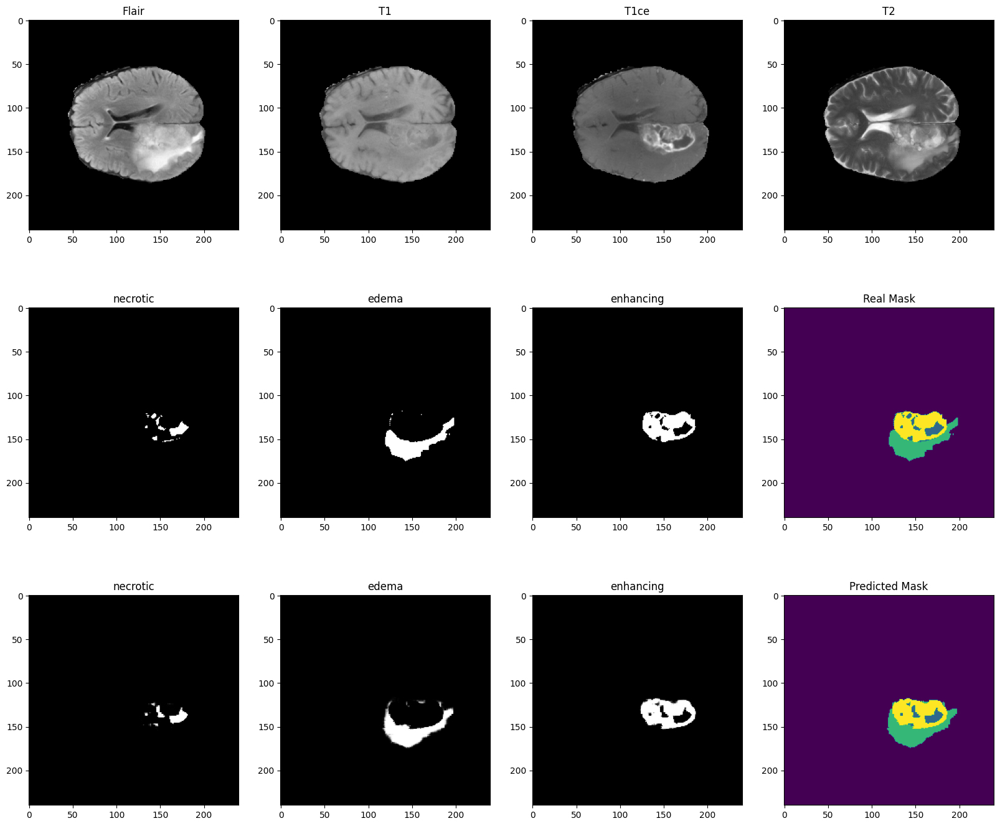

In [31]:
n = 1
show_predicted(test_inputs[n] , test_masks[n])

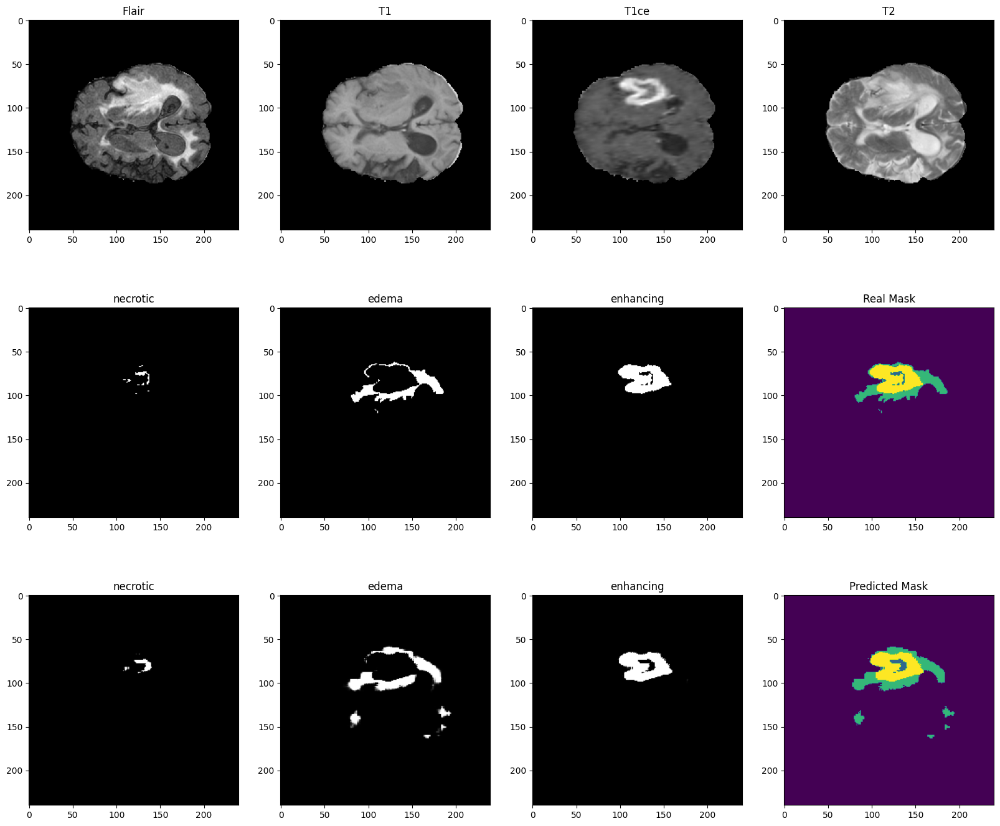

In [32]:
n = 2
show_predicted(test_inputs[n] , test_masks[n])

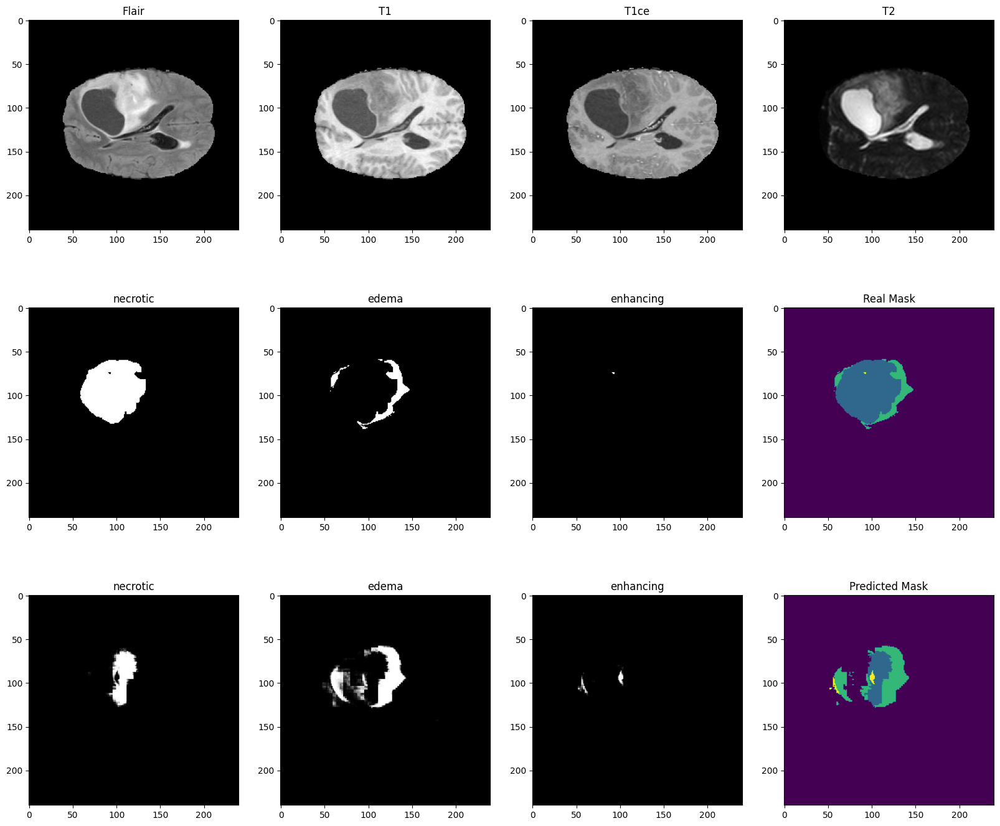

In [33]:
n = 3
show_predicted(test_inputs[n] , test_masks[n])

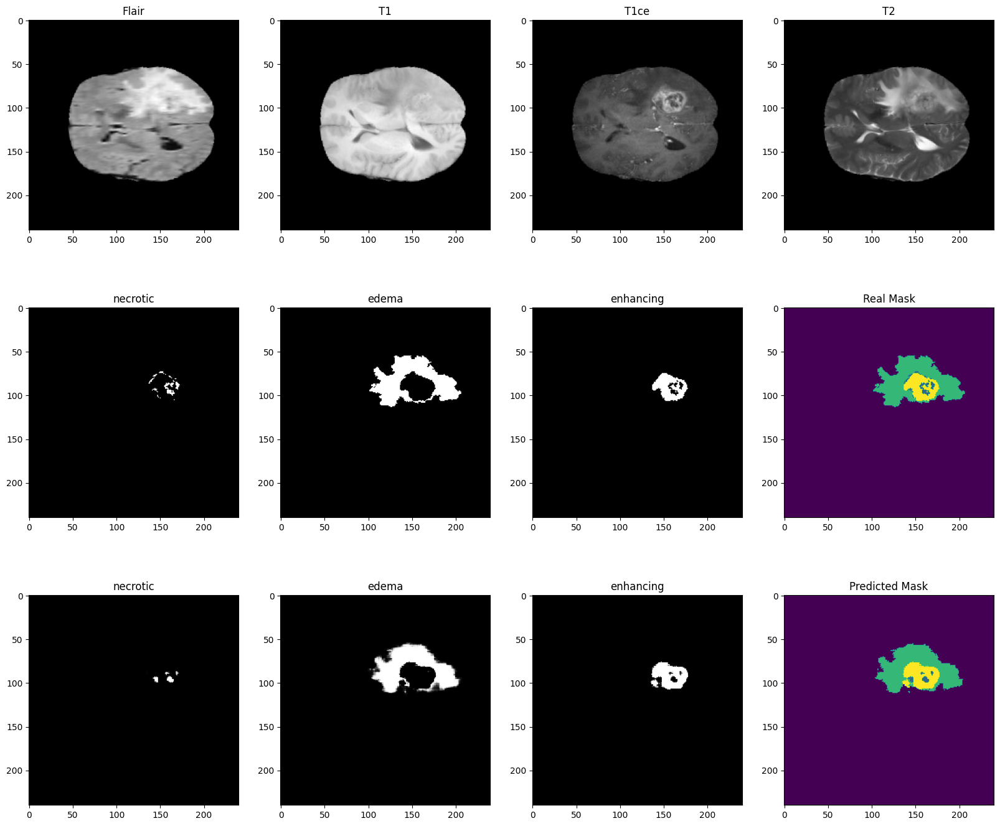

In [35]:
n = 4
show_predicted(test_inputs[n] , test_masks[n])

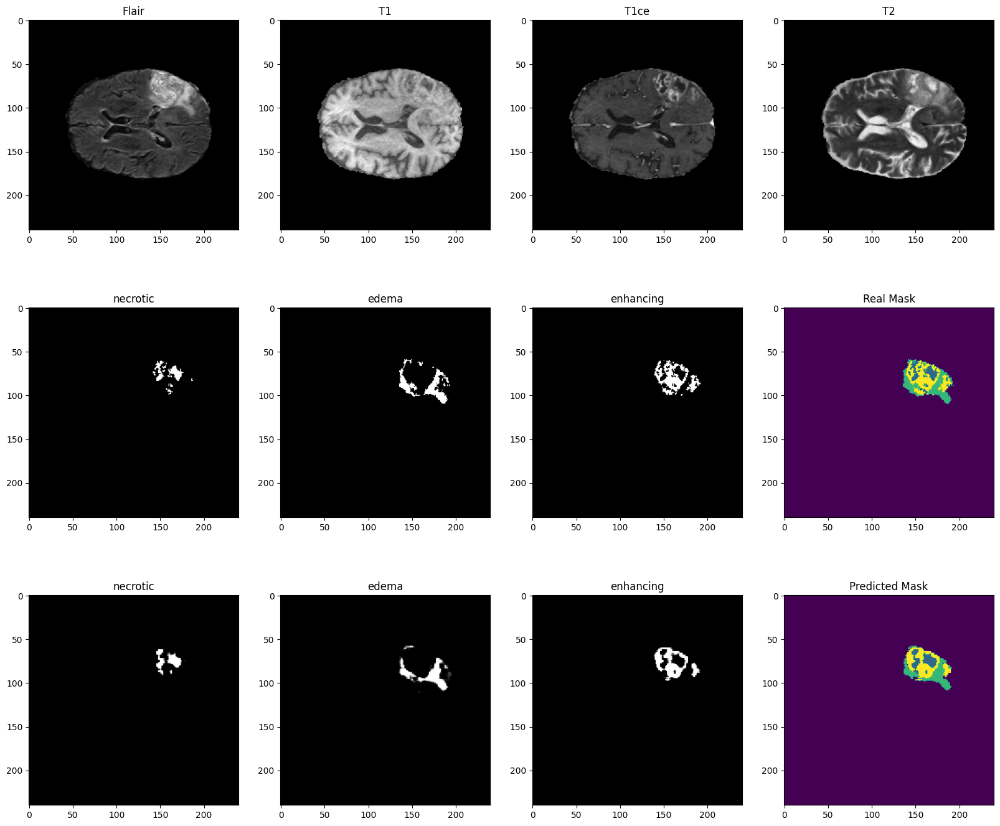

In [36]:
n = 5
show_predicted(test_inputs[n] , test_masks[n])

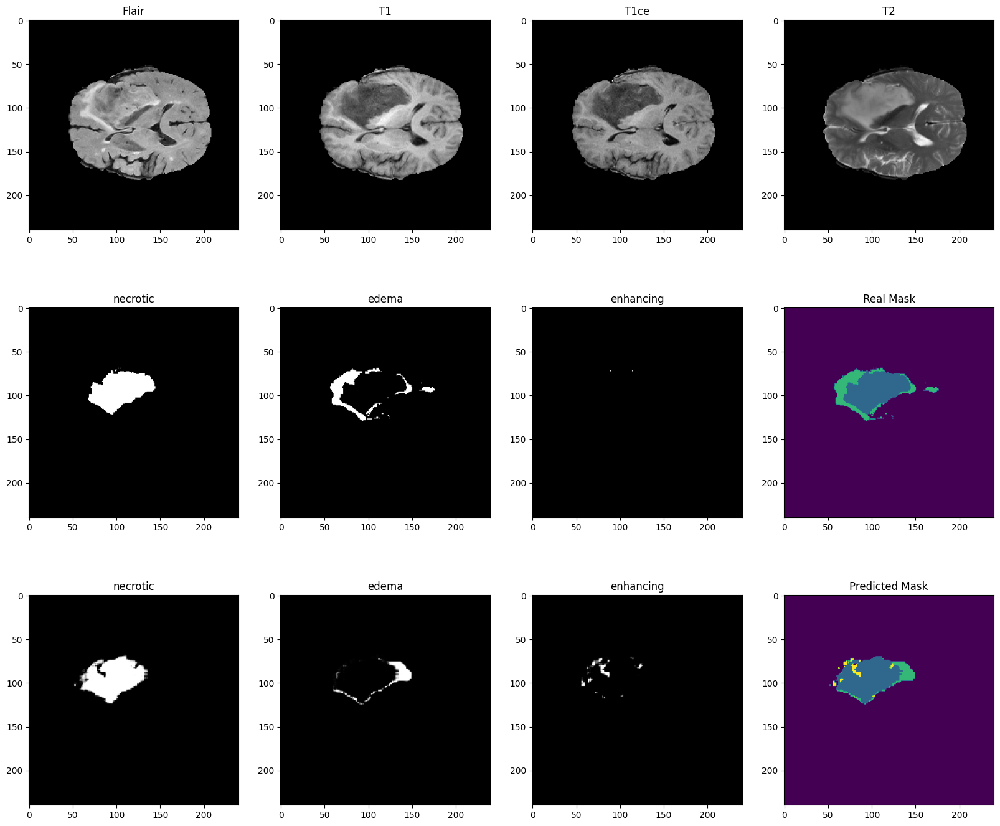

In [37]:
n = 6
show_predicted(test_inputs[n] , test_masks[n])

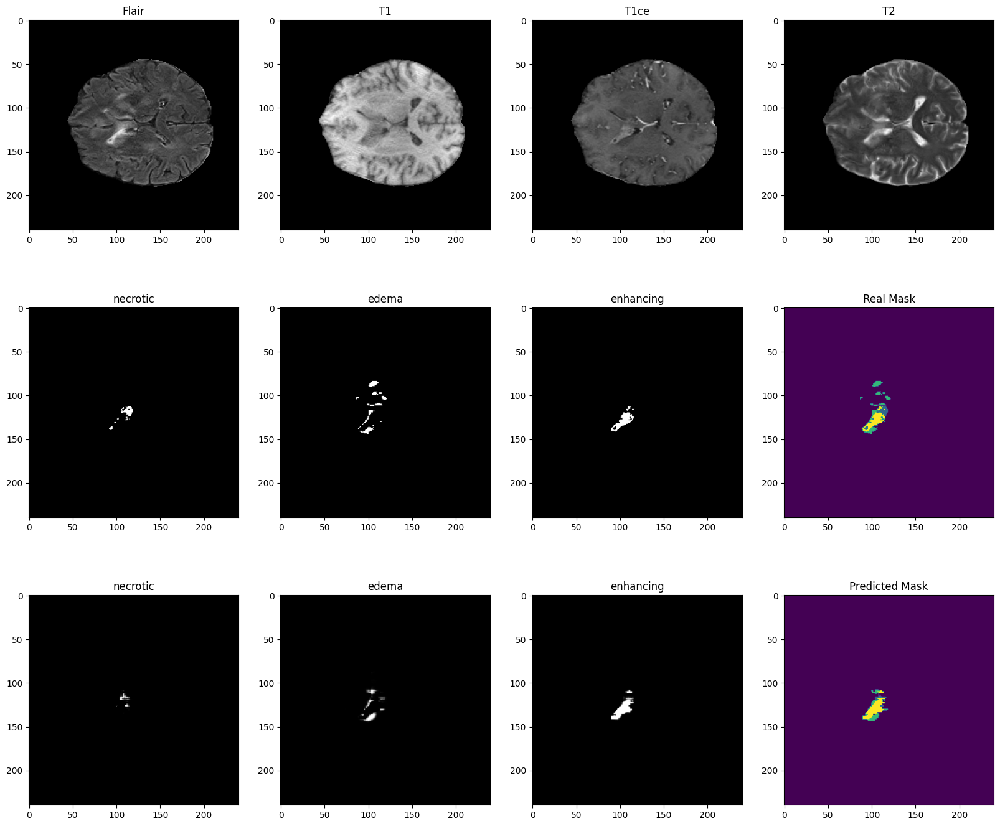

In [38]:
n = 7
show_predicted(test_inputs[n] , test_masks[n])

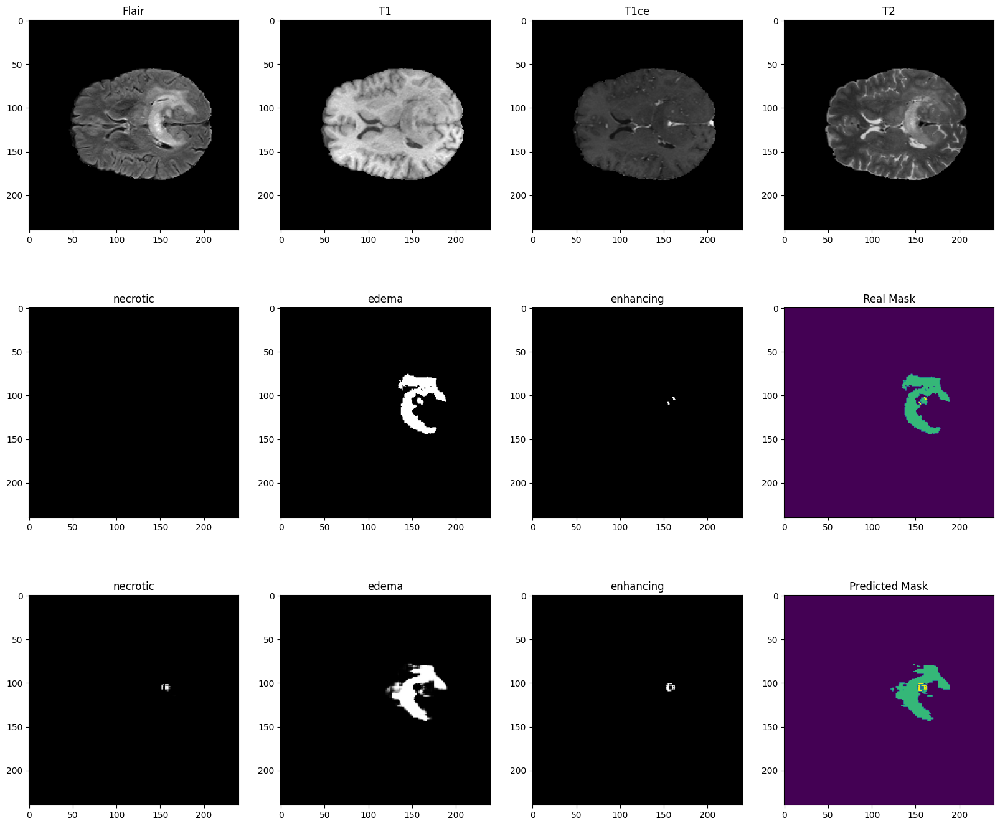

In [39]:
n = 8
show_predicted(test_inputs[n] , test_masks[n])

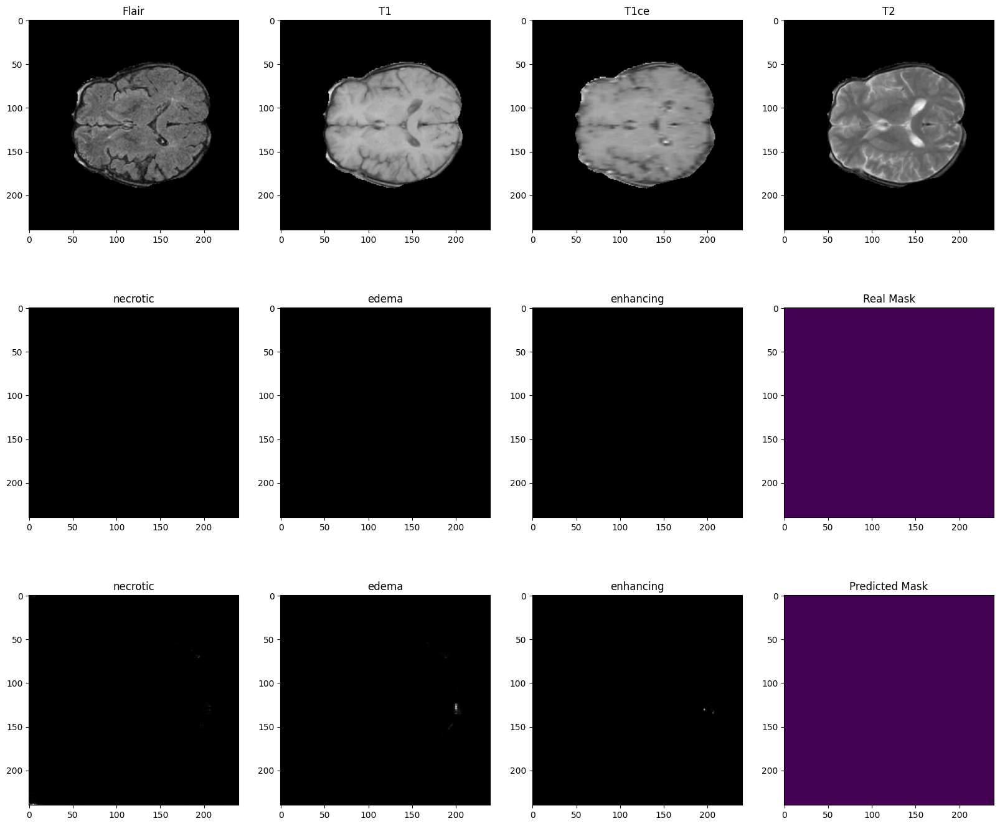

In [40]:
n = 9
show_predicted(test_inputs[n] , test_masks[n])

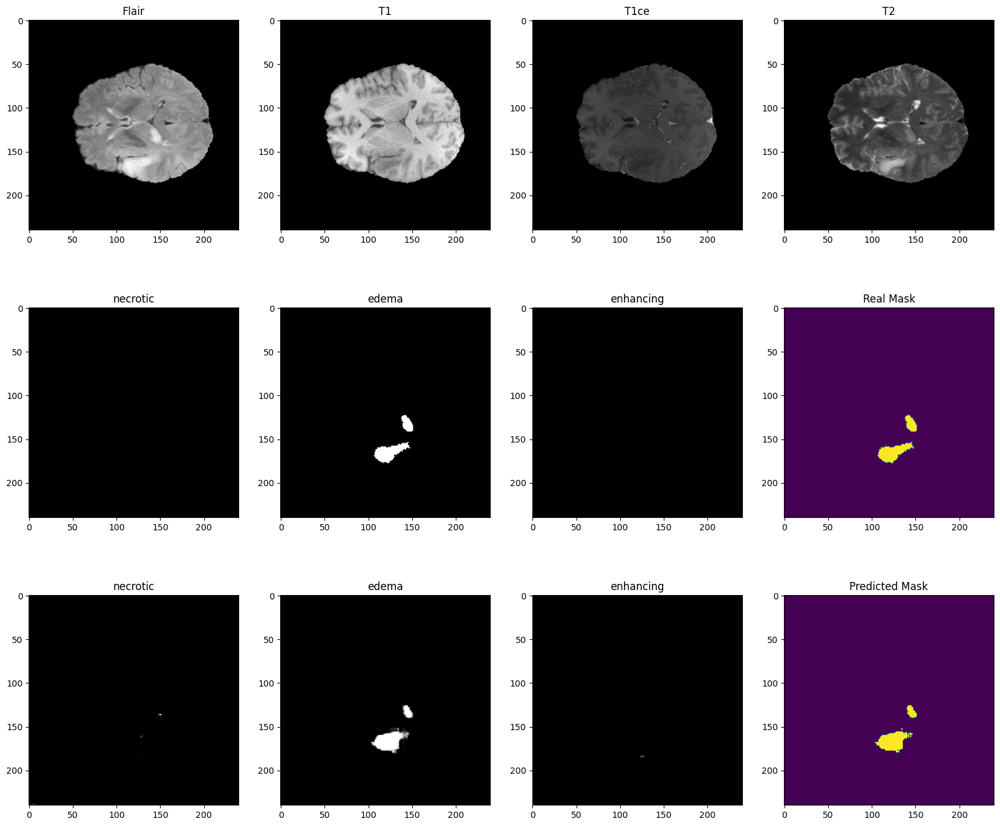

In [41]:
n = 10
show_predicted(test_inputs[n] , test_masks[n])

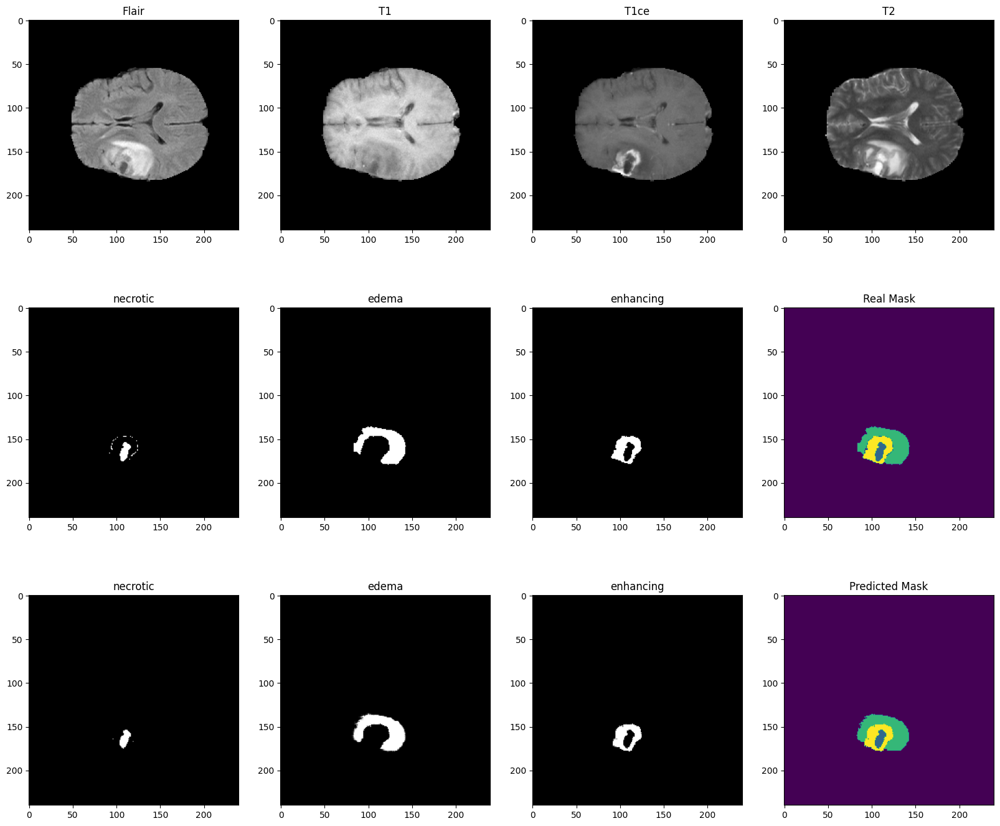

In [42]:
n = 11
show_predicted(test_inputs[n] , test_masks[n])

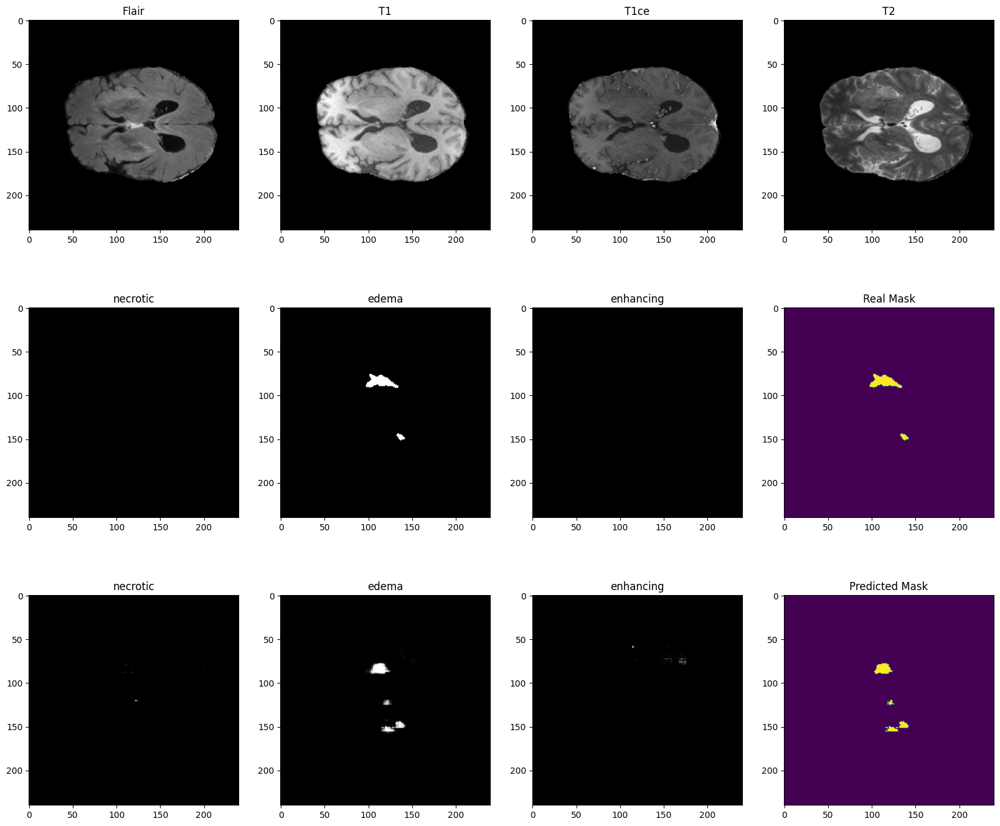

In [43]:
n = 12
show_predicted(test_inputs[n] , test_masks[n])

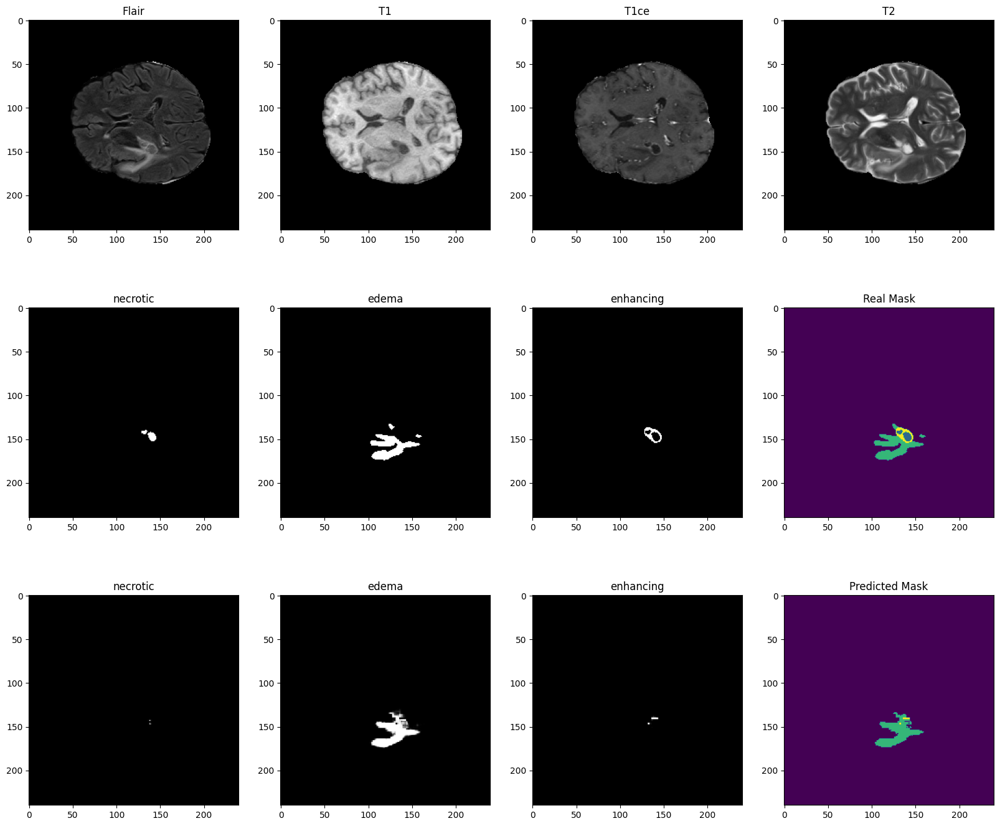

In [44]:
n = 13
show_predicted(test_inputs[n] , test_masks[n])

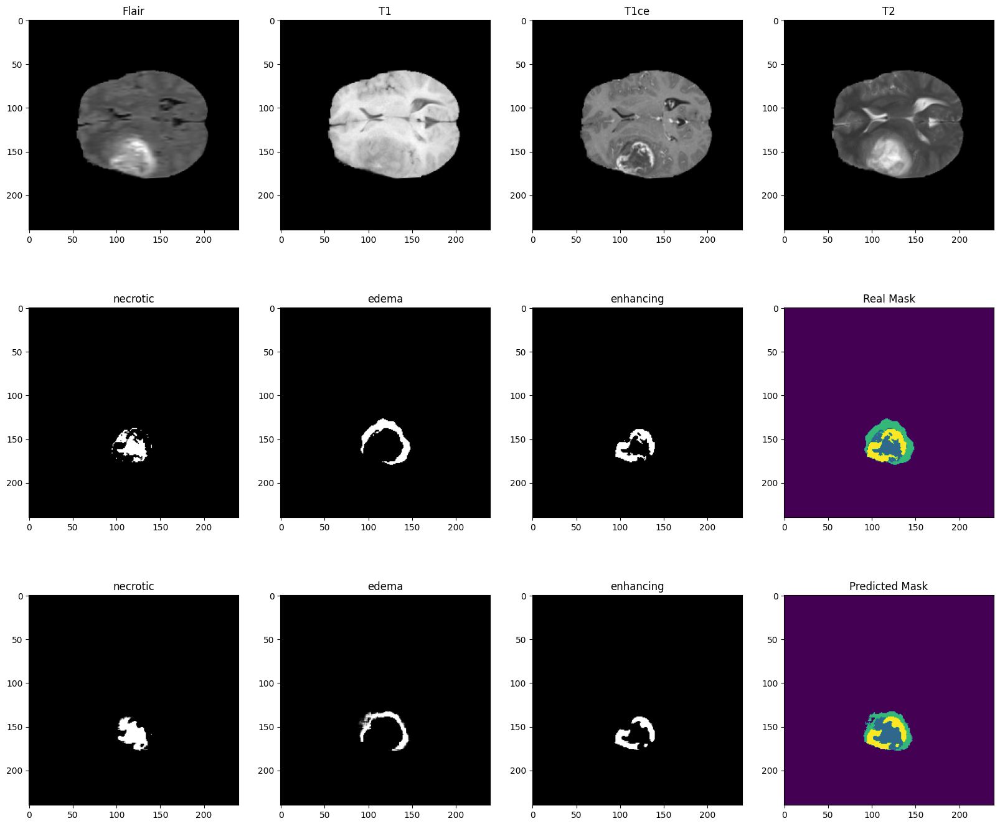

In [45]:
n = 14
show_predicted(test_inputs[n] , test_masks[n])

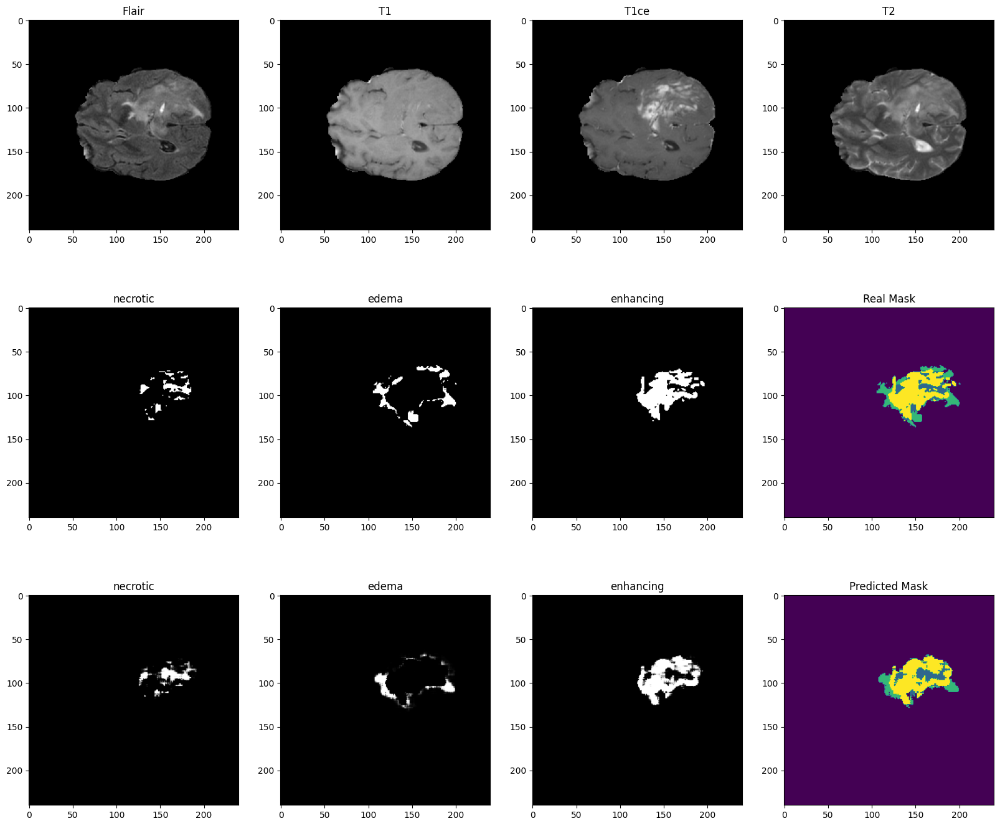

In [46]:
n = 15
show_predicted(test_inputs[n] , test_masks[n])

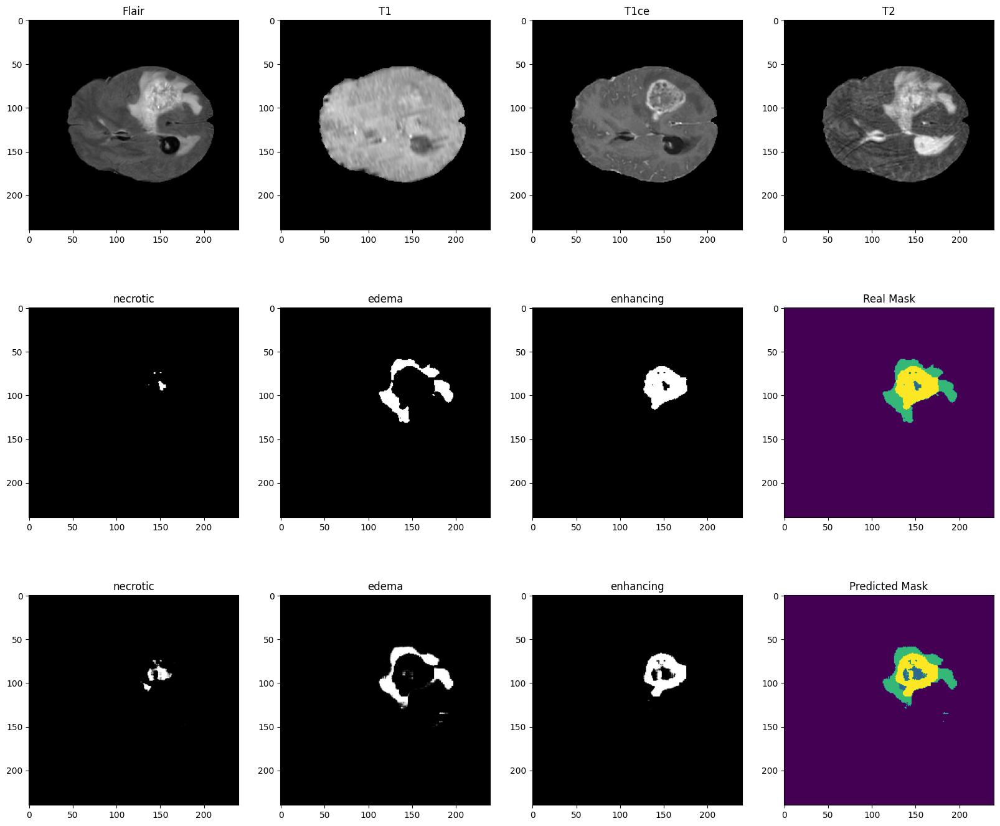

In [47]:
n = 16
show_predicted(test_inputs[n] , test_masks[n])

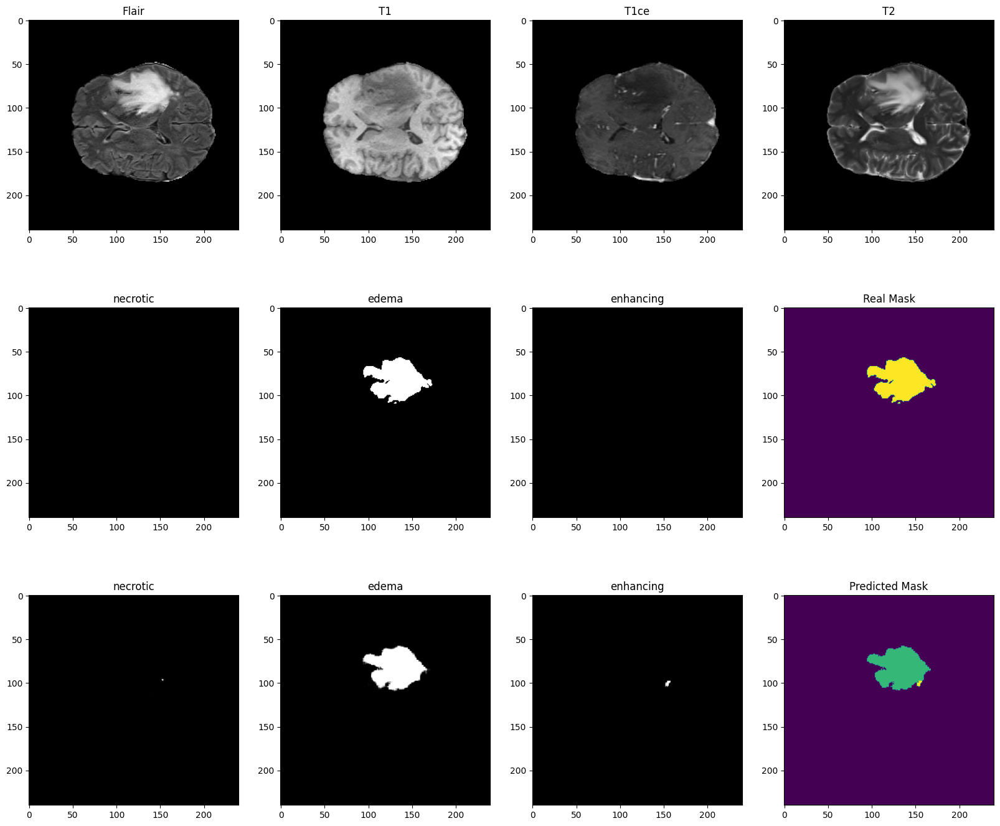

In [48]:
n = 17
show_predicted(test_inputs[n] , test_masks[n])

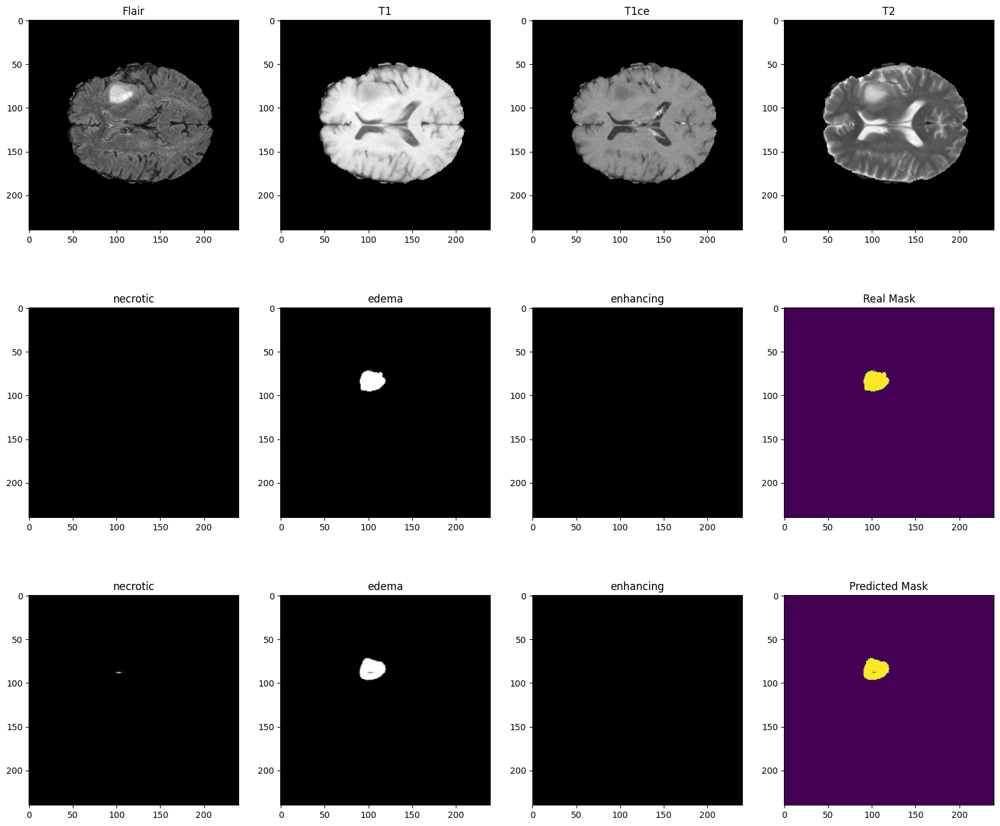

In [49]:
n = 18
show_predicted(test_inputs[n] , test_masks[n])

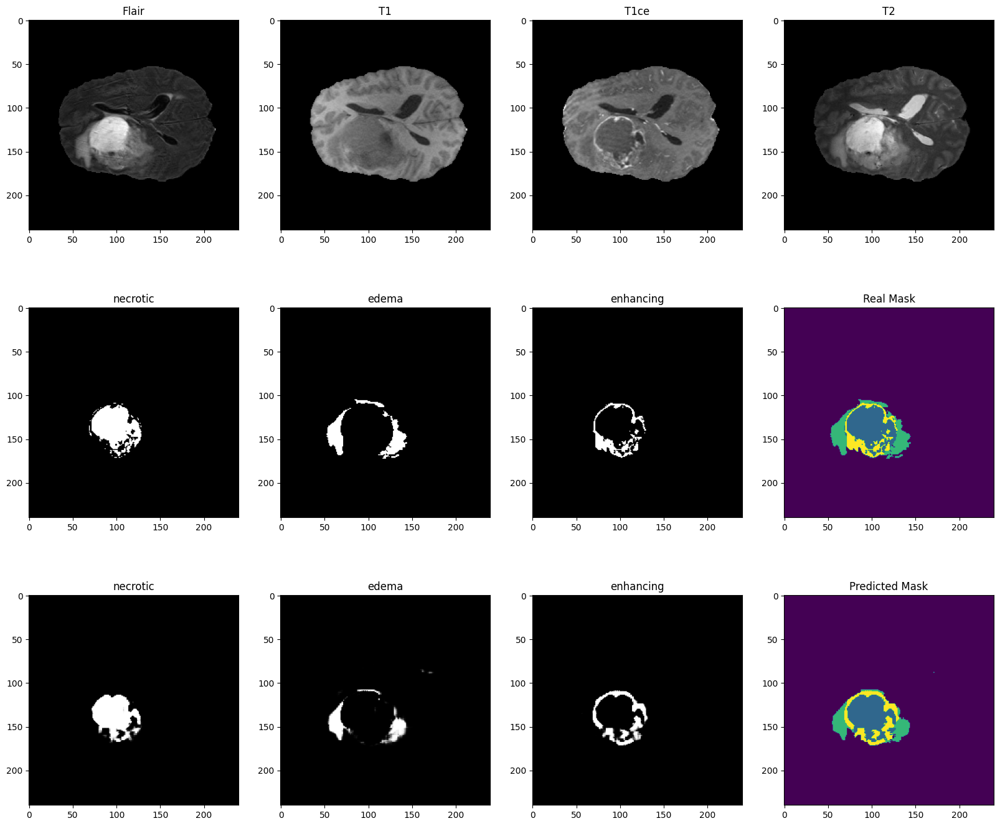

In [50]:
n = 19
show_predicted(test_inputs[n] , test_masks[n])

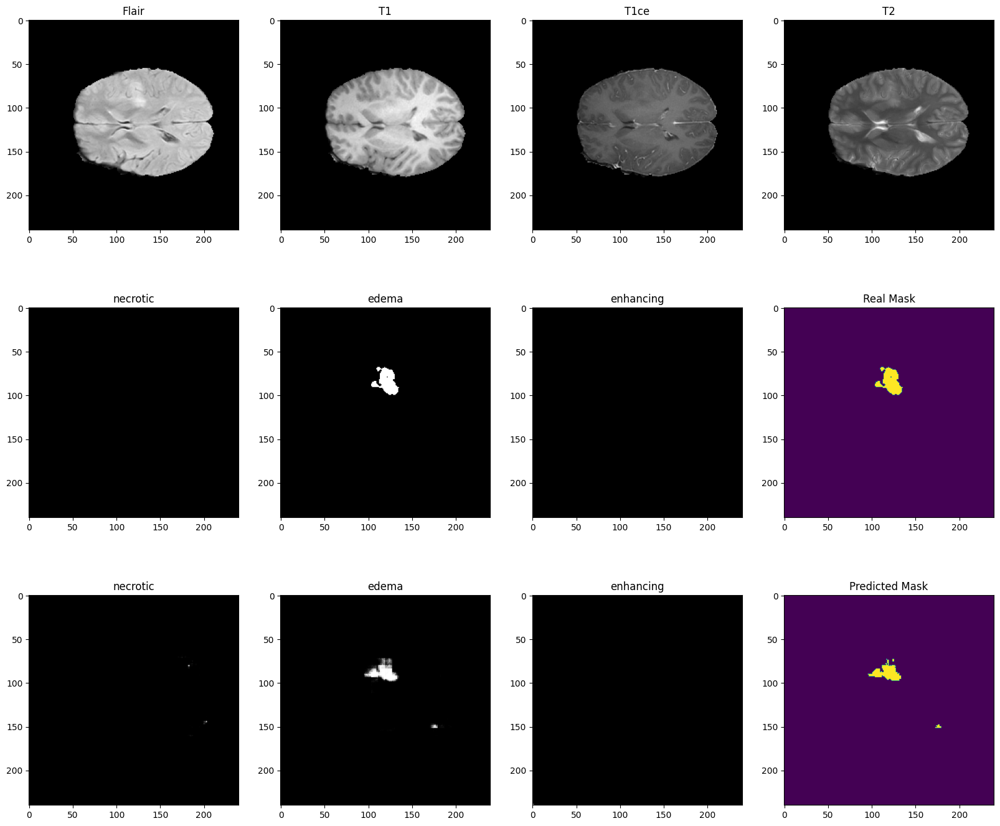

In [51]:
n = 20
show_predicted(test_inputs[n] , test_masks[n])

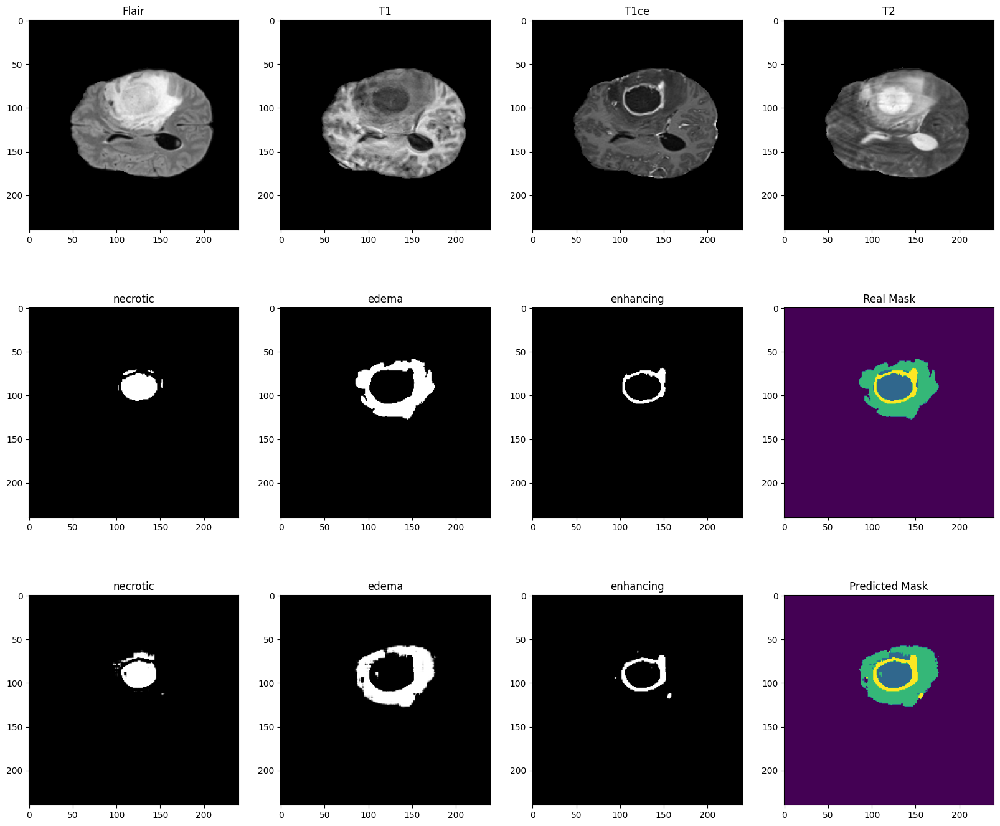

In [52]:
n = 21
show_predicted(test_inputs[n] , test_masks[n])

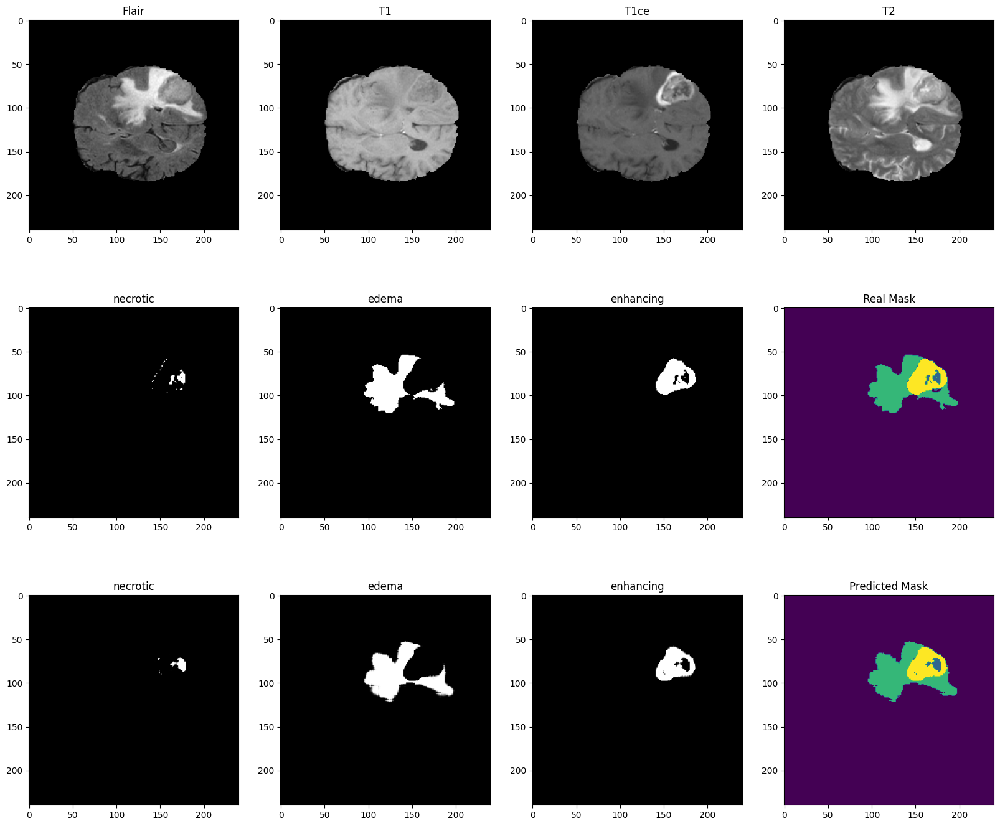

In [53]:
n = 22
show_predicted(test_inputs[n] , test_masks[n])

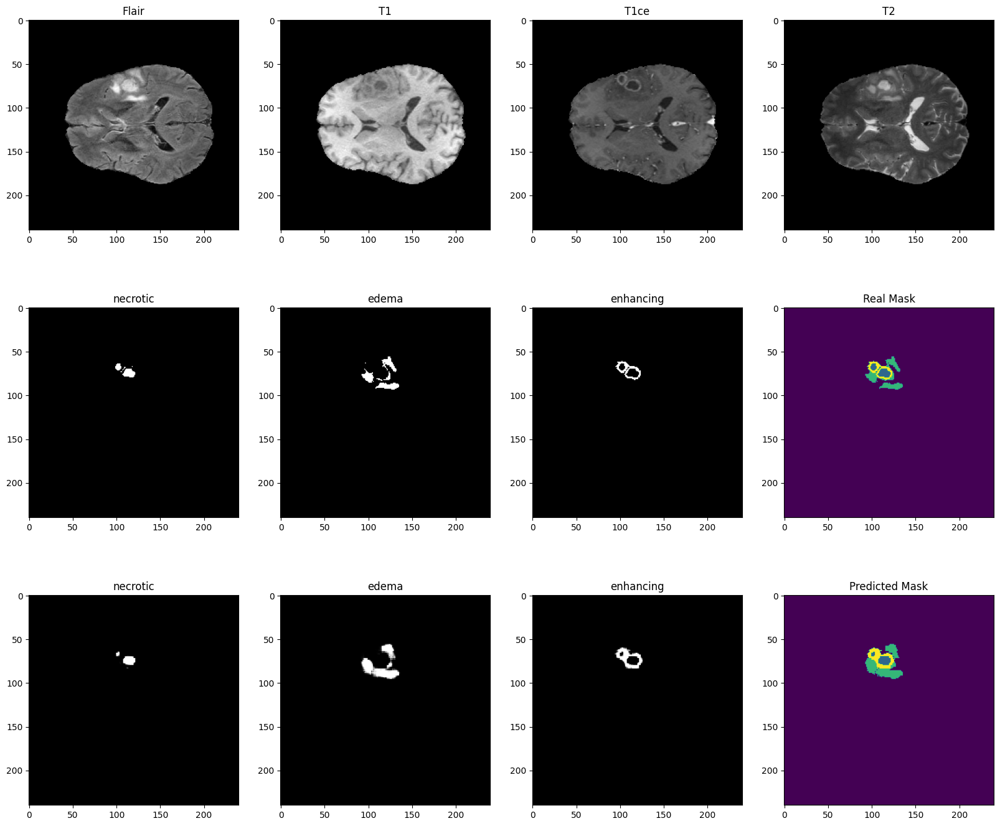

In [54]:
n = 23
show_predicted(test_inputs[n] , test_masks[n])

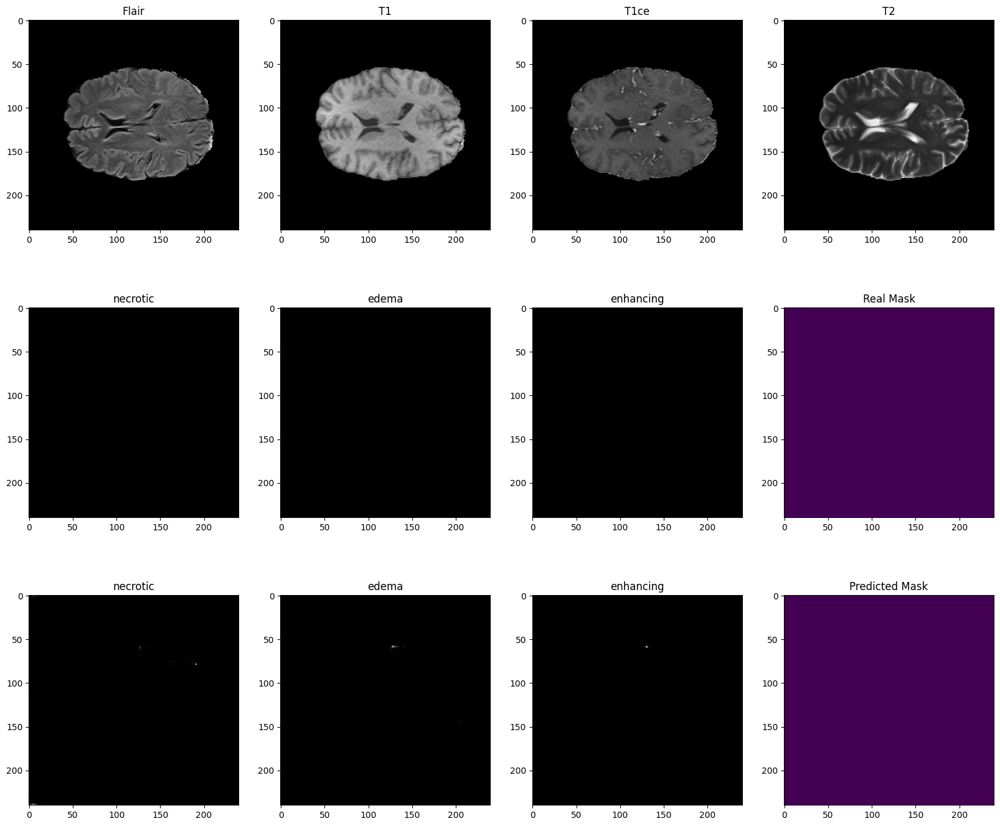

In [55]:
n = 24
show_predicted(test_inputs[n] , test_masks[n])

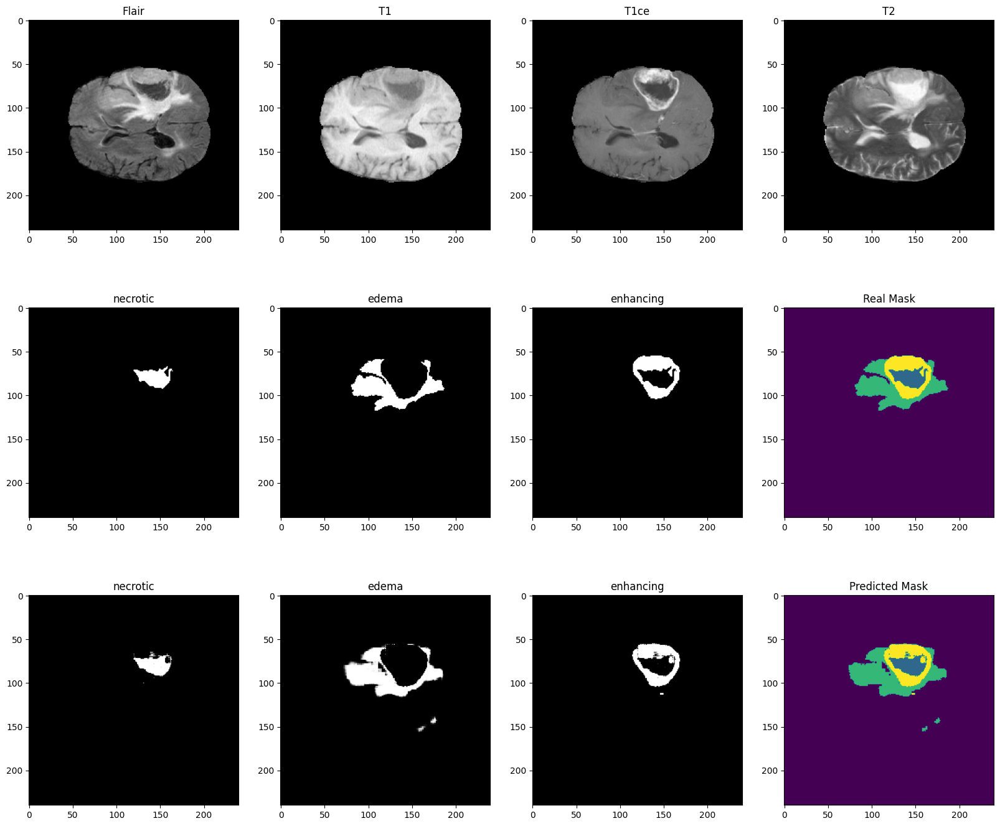

In [56]:
n = 25
show_predicted(test_inputs[n] , test_masks[n])

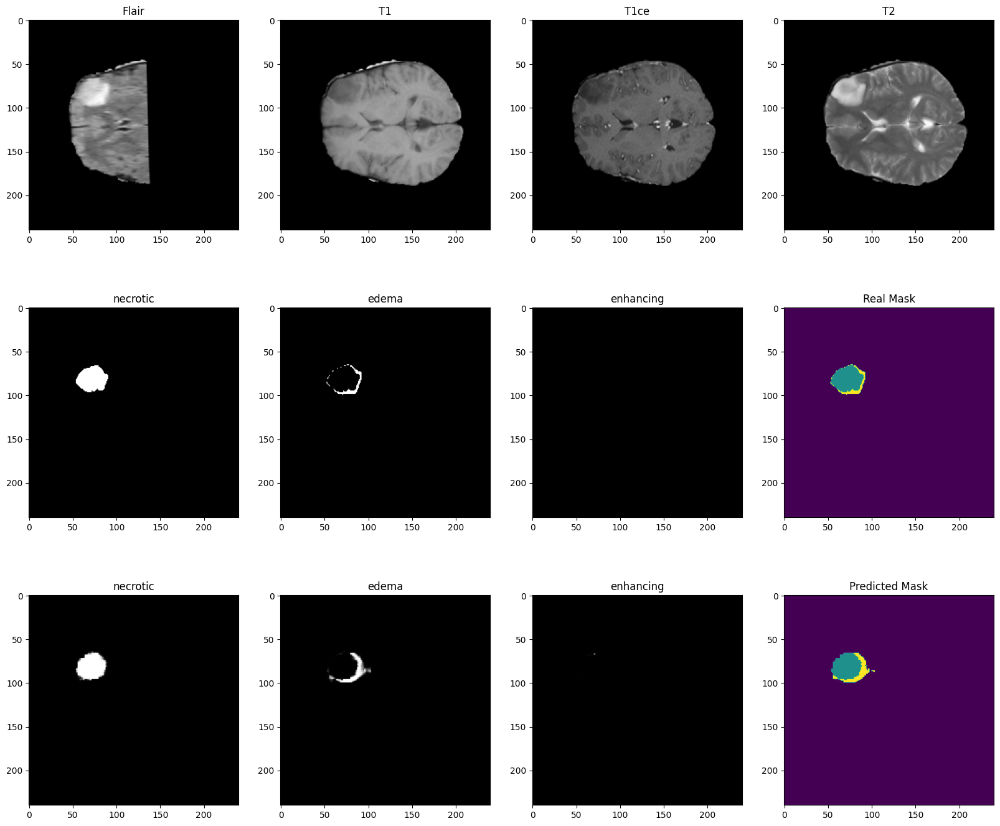

In [57]:
n = 26
show_predicted(test_inputs[n] , test_masks[n])

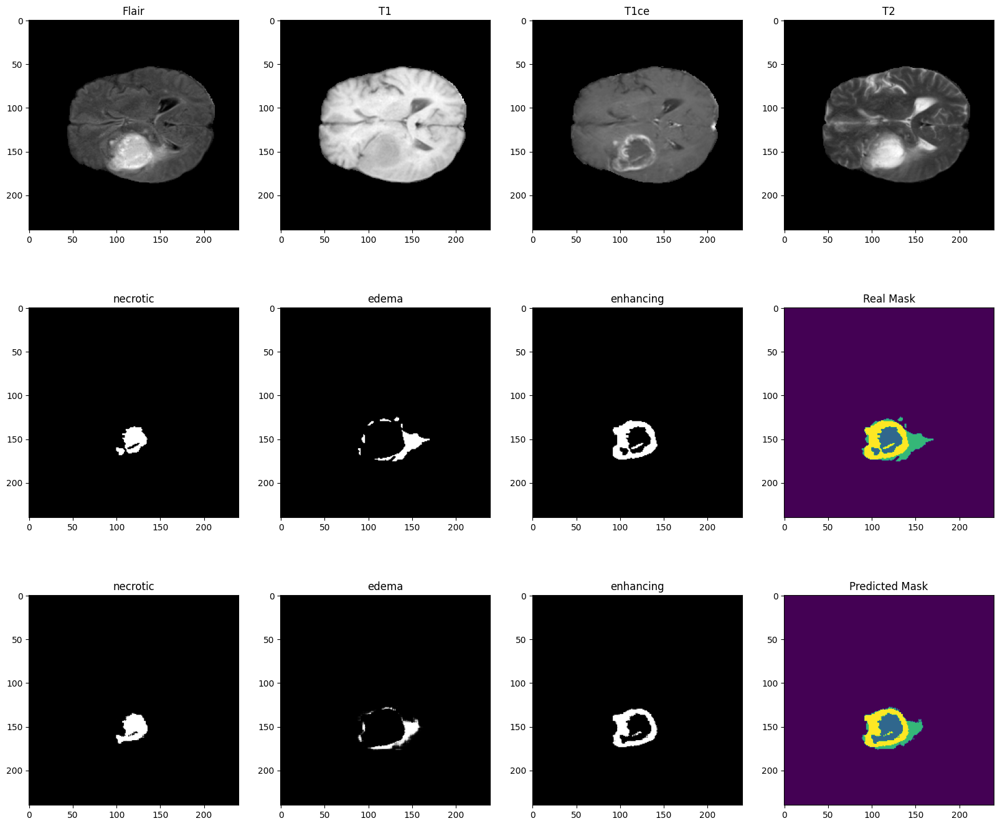

In [58]:
n = 27
show_predicted(test_inputs[n] , test_masks[n])

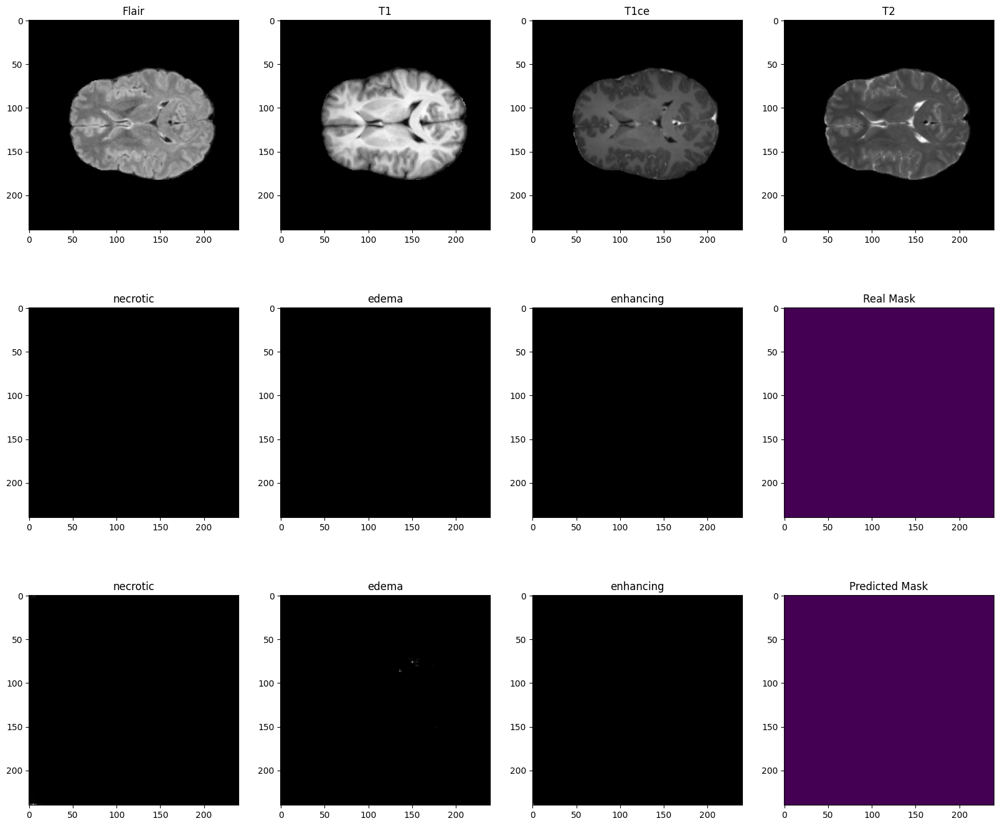

In [59]:
n = 28
show_predicted(test_inputs[n] , test_masks[n])

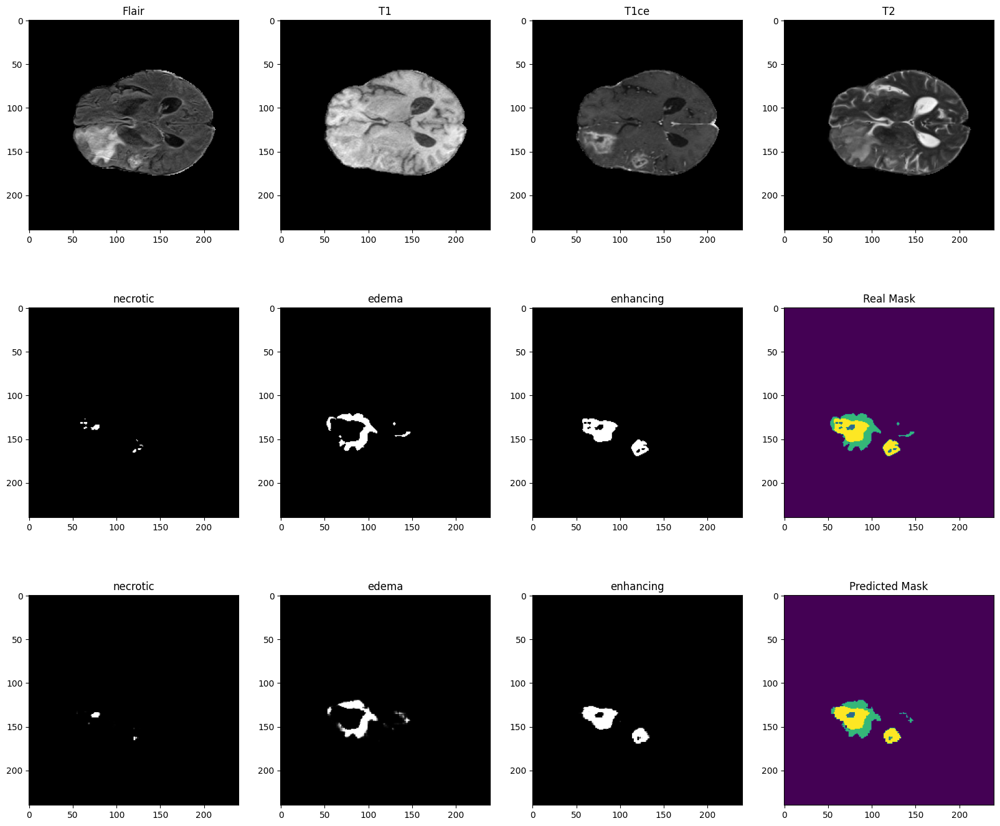

In [60]:
n = 29
show_predicted(test_inputs[n] , test_masks[n])

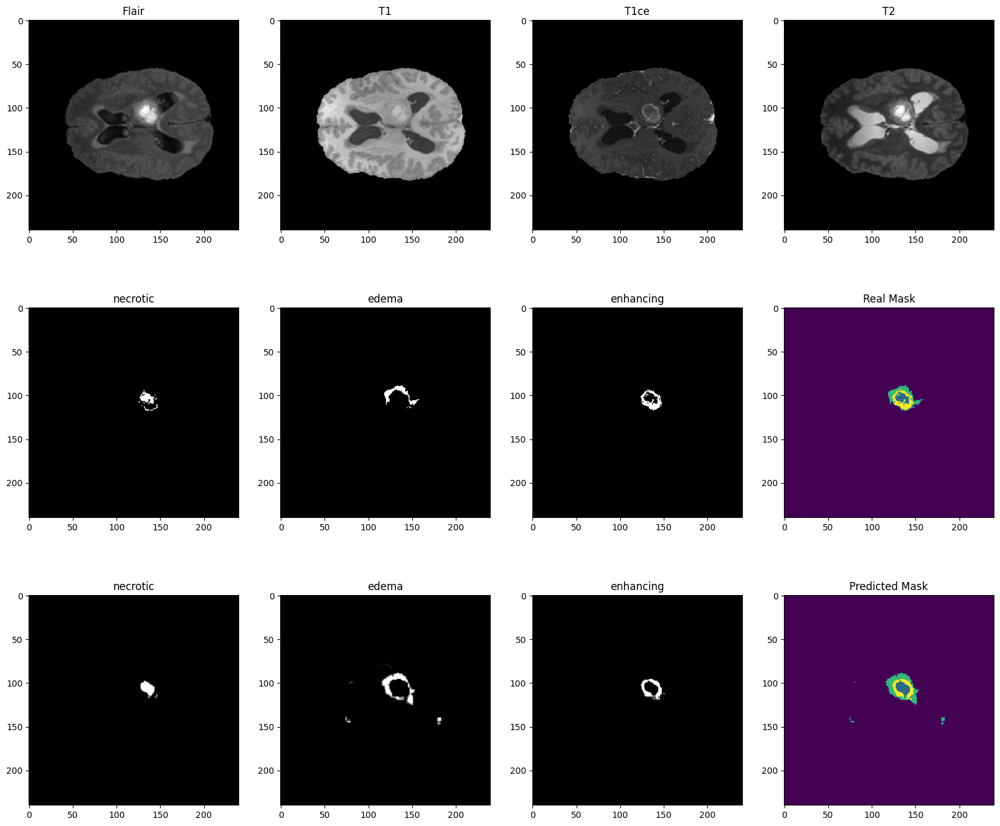

In [61]:
n = 30
show_predicted(test_inputs[n] , test_masks[n])

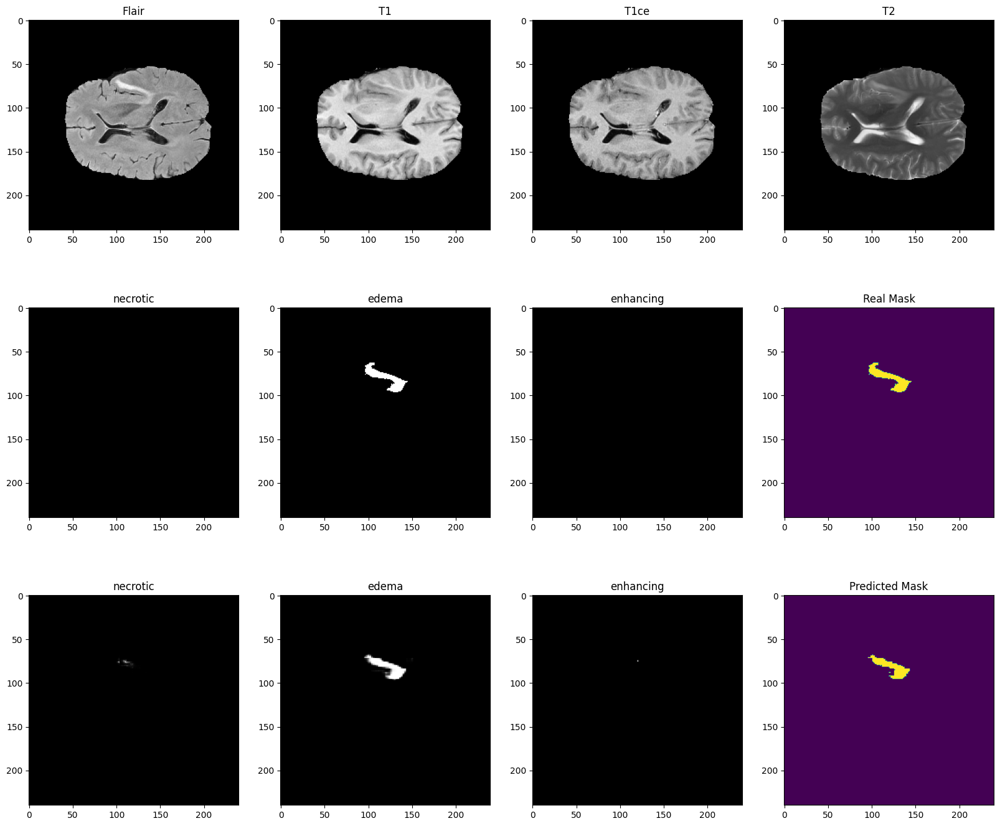

In [62]:
n = 31
show_predicted(test_inputs[n] , test_masks[n])

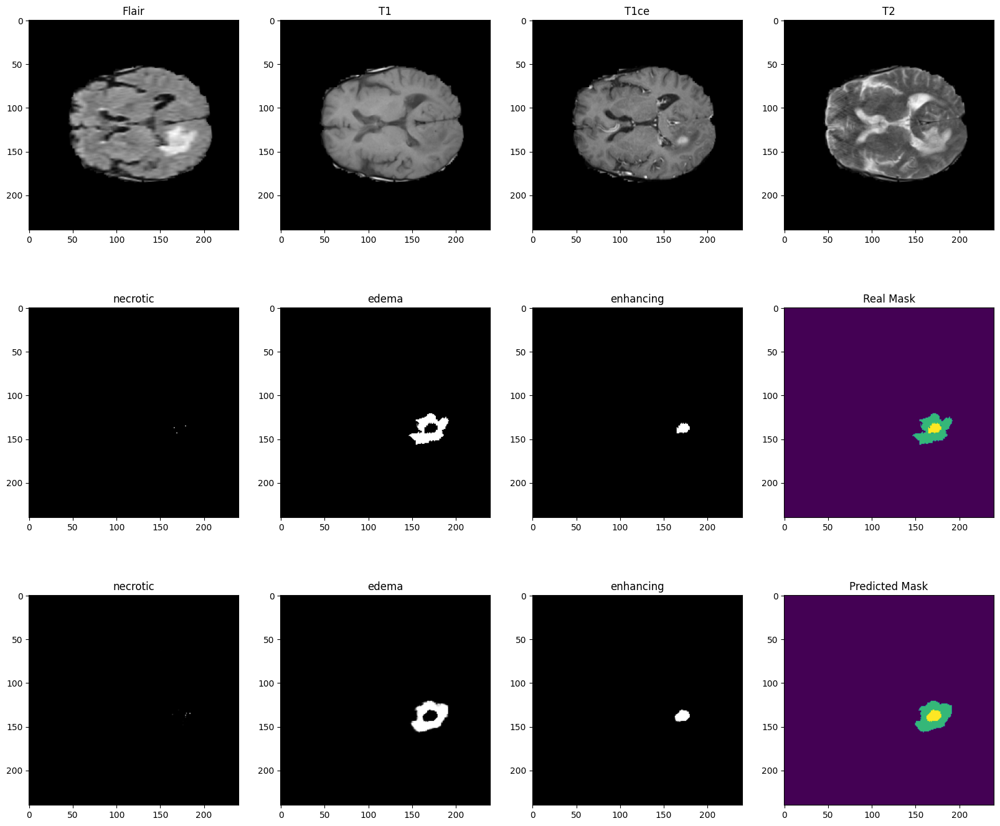

In [63]:
n = 32
show_predicted(test_inputs[n] , test_masks[n])

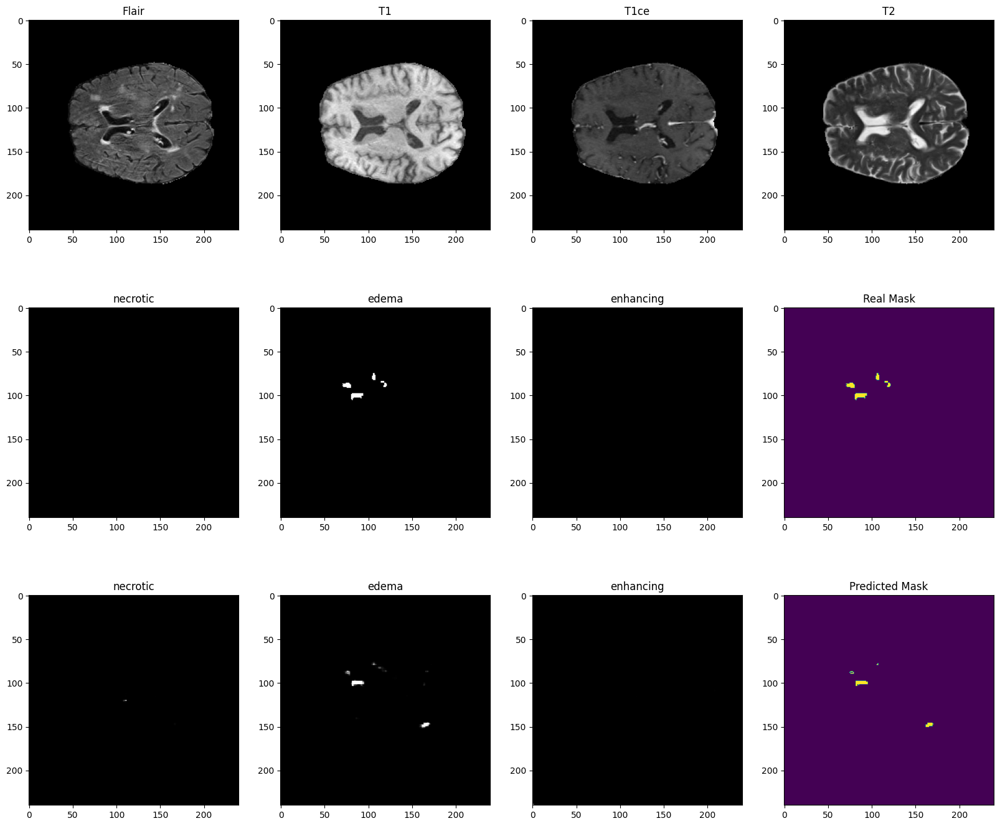

In [64]:
n = 33
show_predicted(test_inputs[n] , test_masks[n])